## Imports and helper function

In [52]:
# Imports and helper functions

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error, root_mean_squared_error
from scipy import stats
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import StandardScaler
from matplotlib.lines import Line2D
from matplotlib import gridspec

In [53]:
#Random seed for reproducibility
RANDOM_SEED = 42

In [54]:
# data = pd.read_csv('../data/Trips_2018.csv')
stations = pd.read_csv('/Users/alexnaderspude/Desktop/Desktop/TUM MMT/DTU Kurs/Group Project/Trips_2018.csv')

In [55]:
# Stations
# Extracts all unique start stations with their coordinates and standardizes column names to a common station format
stations_start = data[['start_station_id', 'start_station_latitude', 'start_station_longitude']]\
                    .drop_duplicates()\
                    .rename(columns={
                        'start_station_id': 'station_id',
                        'start_station_latitude': 'station_latitude',
                        'start_station_longitude': 'station_longitude'
                    })
# Extracts all unique end stations with their coordinates and renames columns to match the unified station structure
stations_end = data[['end_station_id', 'end_station_latitude', 'end_station_longitude']]\
                  .drop_duplicates()\
                  .rename(columns={
                      'end_station_id': 'station_id',
                      'end_station_latitude': 'station_latitude',
                      'end_station_longitude': 'station_longitude'
                  })
# Combines start and end station lists into one unified station dataset, removes duplicates, and resets the index
stations = pd.concat([stations_start, stations_end]).drop_duplicates().reset_index(drop=True)

In [56]:
# Rounds all station latitude and longitude values to four decimals and removes any duplicate stations based on identical IDs and coordinates
stations['station_latitude'] = stations['station_latitude'].round(4)
stations['station_longitude'] = stations['station_longitude'].round(4)
stations = stations.drop_duplicates(subset=['station_id', 'station_latitude', 'station_longitude'])

In [57]:
stations.info()

<class 'pandas.core.frame.DataFrame'>
Index: 848 entries, 0 to 848
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   station_id         848 non-null    float64
 1   station_latitude   848 non-null    float64
 2   station_longitude  848 non-null    float64
dtypes: float64(3)
memory usage: 26.5 KB


In [58]:
#Creates sets of all start and end station IDs, classifies each station as a start, end, or both based on where it appears in the dataset, and removes stations that do not appear in either list
start_stations_set = set(data['start_station_id'].unique())
end_stations_set = set(data['end_station_id'].unique())

def categorize_station(station_id):
    in_start = station_id in start_stations_set
    in_end = station_id in end_stations_set
    
    if in_start and in_end:
        return 'both'
    elif in_start:
        return 'start'
    elif in_end:
        return 'end'
    else:
        return 'No station id'
    
stations['category'] = stations['station_id'].apply(categorize_station)
stations = stations[stations['category'] != 'No station id']

Text(0, 0.5, 'Latitude')

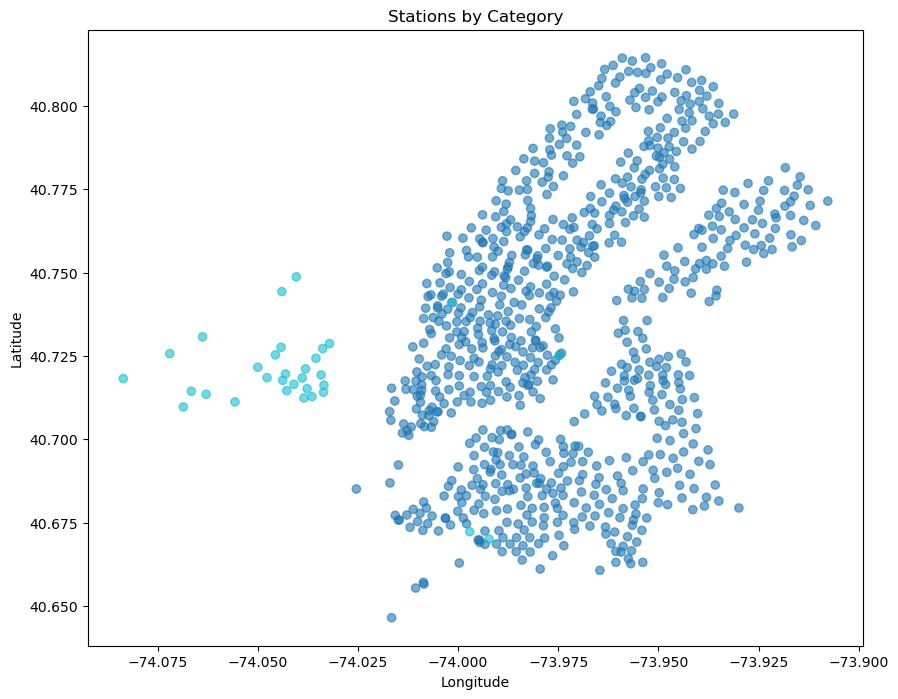

In [59]:
# Converts station categories into numeric color codes and plots all stations on a scatterplot colored by category to visualize their spatial distribution
categories = stations['category'].astype('category')
colors = categories.cat.codes  
fig = plt.figure(figsize=(10, 8))
plt.scatter(
    stations['station_longitude'],
    stations['station_latitude'],
    c=colors,
    cmap='tab10',     
    alpha=0.6
)

plt.title('Stations by Category')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

## Clustering

In [60]:
# Defines helper functions to visualize station clusters, determine the optimal number of K-Means clusters using the elbow method, and evaluate clustering quality using silhouette scores
def plot_station_clusters(df):
    n_clusters = len(set(df["station_cluster"]))
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.scatterplot(data=df, x='station_longitude', y='station_latitude', hue='station_cluster', palette='tab20', ax=ax)
    ax.set_title(f'Station Clusters (n={n_clusters})')

def elbow_method(data, max_k):
    sse = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_SEED)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 31), sse, marker='o')
    plt.title('Elbow Method For Optimal k')
    plt.xlabel('Number of clusters k')
    plt.ylabel('Sum of squared distances')
    plt.xticks(range(1, 31))
    plt.show()

def silloute_score_plot(data, max_k):
    scores = []
    for k in range(20, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_SEED)
        kmeans.fit(data)
        labels = kmeans.labels_
        score = silhouette_score(data, labels)
        scores.append(score)
    plt.figure(figsize=(10, 6))
    plt.plot(range(20, max_k + 1), scores, marker='o')
    plt.title('Silhouette Score For Optimal k')
    plt.xlabel('Number of clusters k')
    plt.ylabel('Silhouette Score')
    plt.xticks(range(20, max_k + 1))
    plt.show()

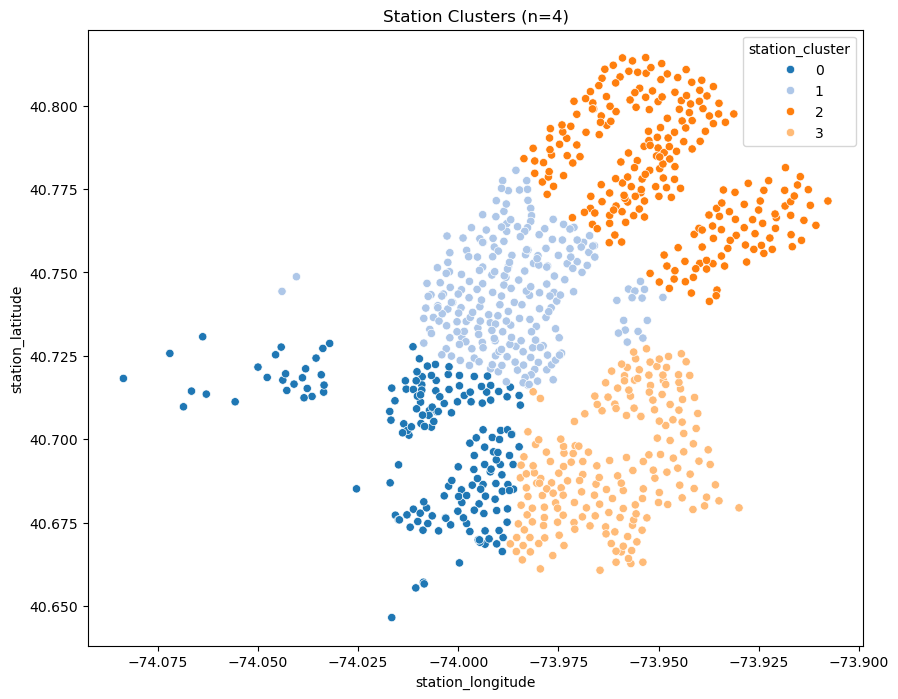

In [61]:
# Performs K-Means clustering with four clusters on station coordinates, assigns each station a cluster label, and visualizes the resulting clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(stations[['station_latitude', 'station_longitude']])
stations['station_cluster'] = kmeans.labels_
plot_station_clusters(stations)

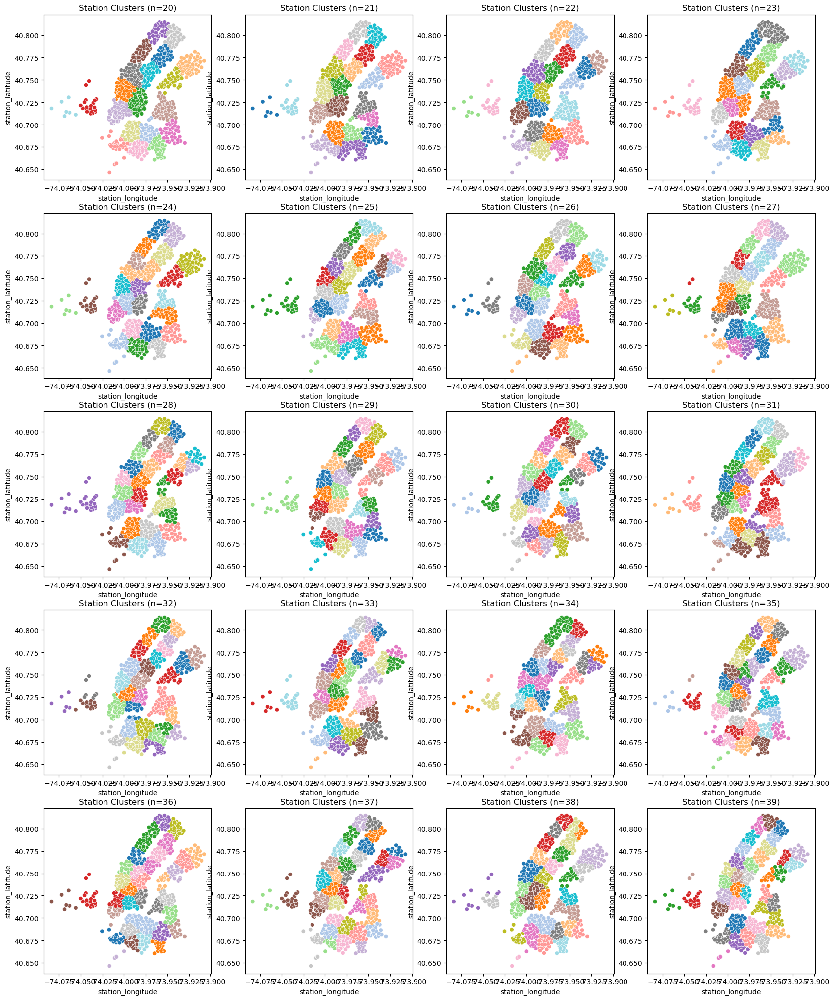

In [62]:
# Iteratively applies K-Means with 20 to 39 clusters and visualizes each clustering configuration in a 5×4 subplot grid to compare spatial patterns across different cluster counts
fig, ax = plt.subplots(5, 4, figsize=(20, 25))
for n_clusters in range(1, 21):
    kmeans = KMeans(n_clusters=n_clusters+19)
    kmeans.fit(stations[['station_latitude', 'station_longitude']])
    stations['station_cluster'] = kmeans.labels_
    sns.scatterplot(data=stations, x='station_longitude', y='station_latitude', legend=False, hue='station_cluster', palette='tab20', ax=ax[(n_clusters-1)//4, (n_clusters-1)%4])
    ax[(n_clusters-1)//4, (n_clusters-1)%4].set_title(f'Station Clusters (n={n_clusters+19})')

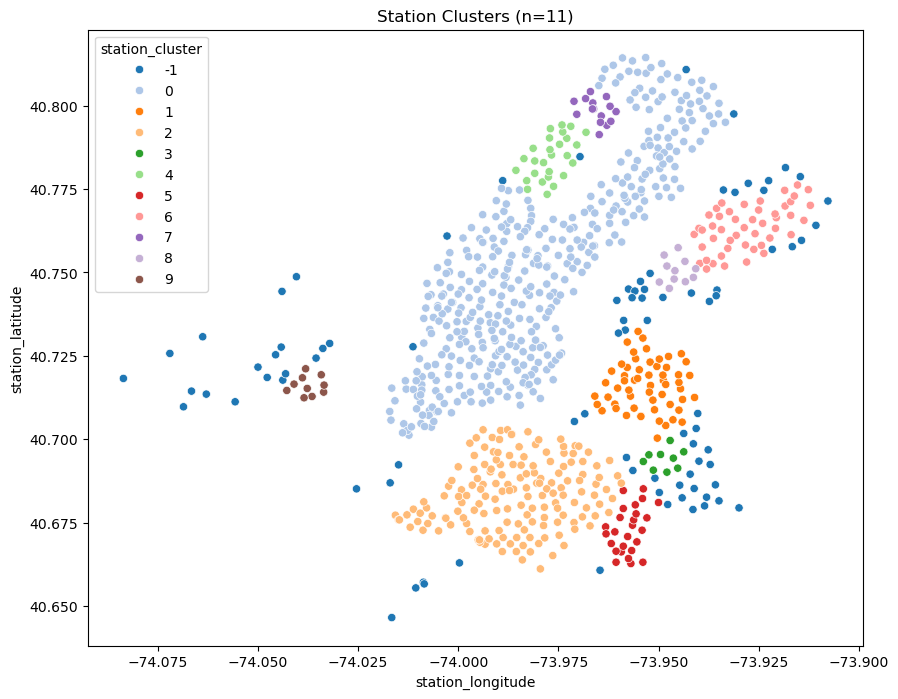

In [63]:
# Applies DBSCAN density-based clustering to the station coordinates using a fixed epsilon and minimum sample size, assigns cluster labels, and visualizes the resulting spatial clusters

dbscan = DBSCAN(eps=0.006, min_samples=10)
dbscan.fit(stations[['station_latitude', 'station_longitude']])
stations['station_cluster'] = dbscan.labels_
plot_station_clusters(stations)

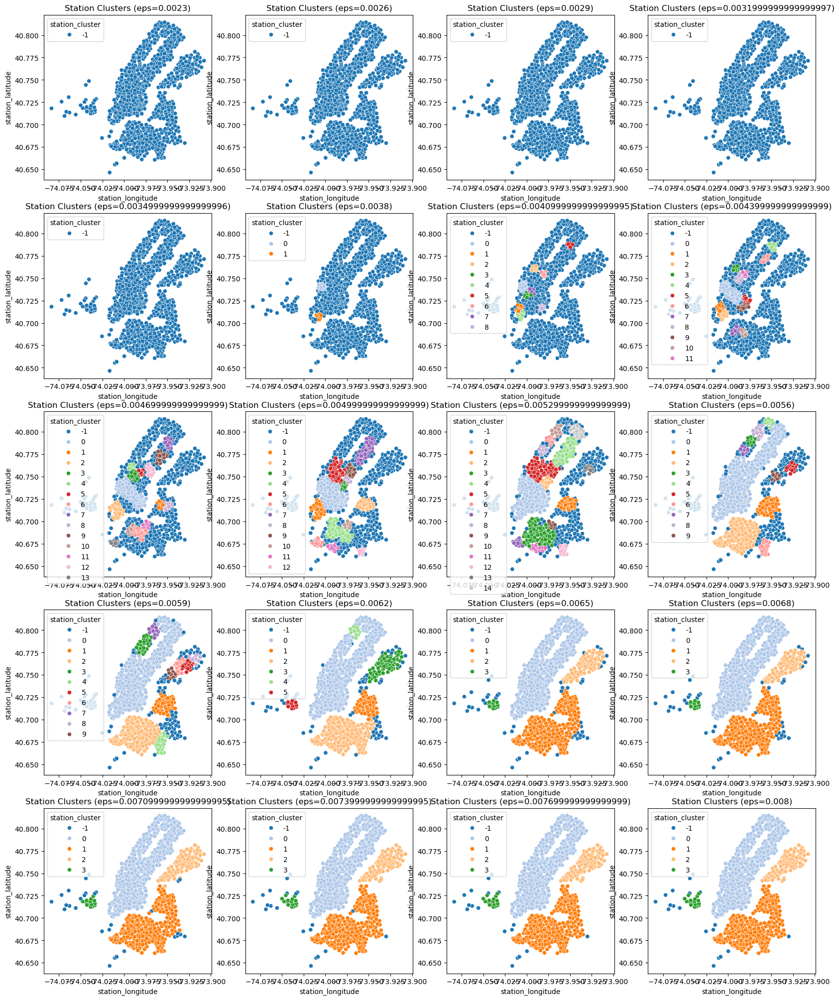

In [64]:
# Runs DBSCAN with 20 increasing epsilon values to analyze how cluster shapes and counts change with density thresholds, visualizing each result in a 5×4 subplot grid

fig, ax = plt.subplots(5, 4, figsize=(20, 25))
for i in range(1, 21):
    eps = 0.002+0.0003*i
    dbscan = DBSCAN(eps=eps, min_samples=10)
    dbscan.fit(stations[['station_latitude', 'station_longitude']])
    stations['station_cluster'] = dbscan.labels_
    sns.scatterplot(data=stations, x='station_longitude', y='station_latitude', legend="full", hue='station_cluster', palette='tab20', ax=ax[(i-1)//4, (i-1)%4])
    ax[(i-1)//4, (i-1)%4].set_title(f'Station Clusters (eps={eps})')

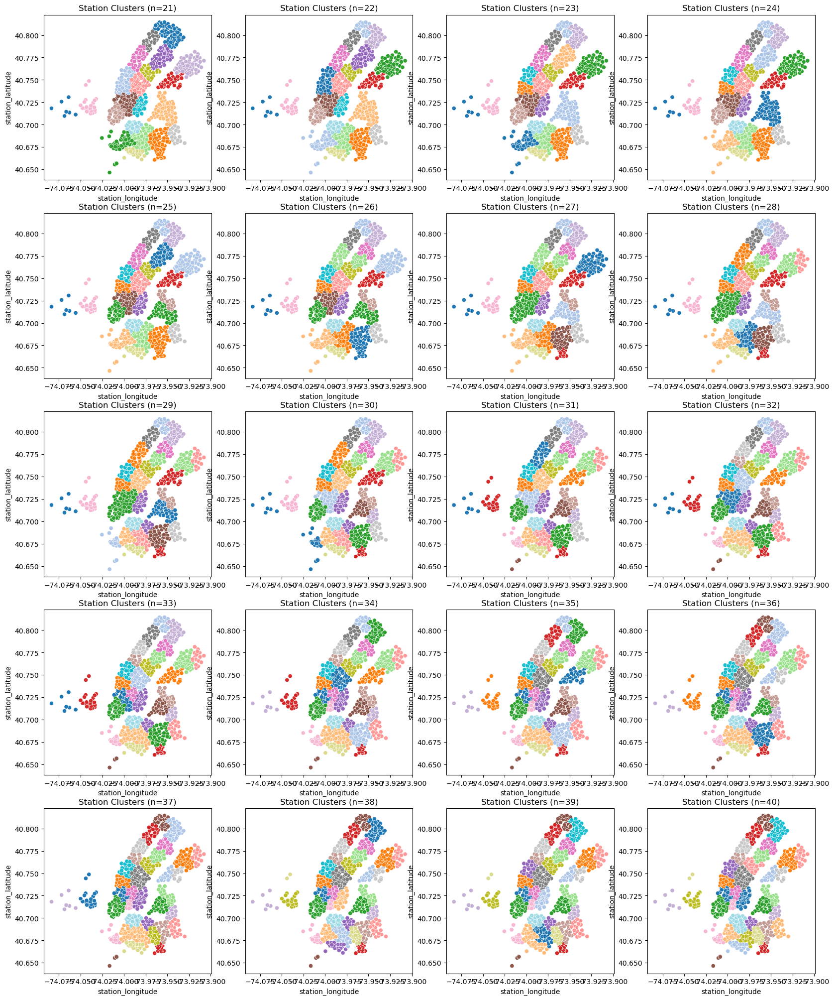

In [65]:
# Applies Agglomerative Clustering with 21 to 40 clusters across a 5×4 subplot grid to compare how hierarchical clustering partitions the station locations at different cluster counts
fig, ax = plt.subplots(5, 4, figsize=(20, 25))
for n_clusters in range(1, 21):
    agglo = AgglomerativeClustering(n_clusters=n_clusters+20)
    agglo.fit(stations[['station_latitude', 'station_longitude']])
    stations['station_cluster'] = agglo.labels_
    sns.scatterplot(data=stations, x='station_longitude', y='station_latitude', legend=False, hue='station_cluster', palette='tab20', ax=ax[(n_clusters-1)//4, (n_clusters-1)%4])
    ax[(n_clusters-1)//4, (n_clusters-1)%4].set_title(f'Station Clusters (n={n_clusters+20})')

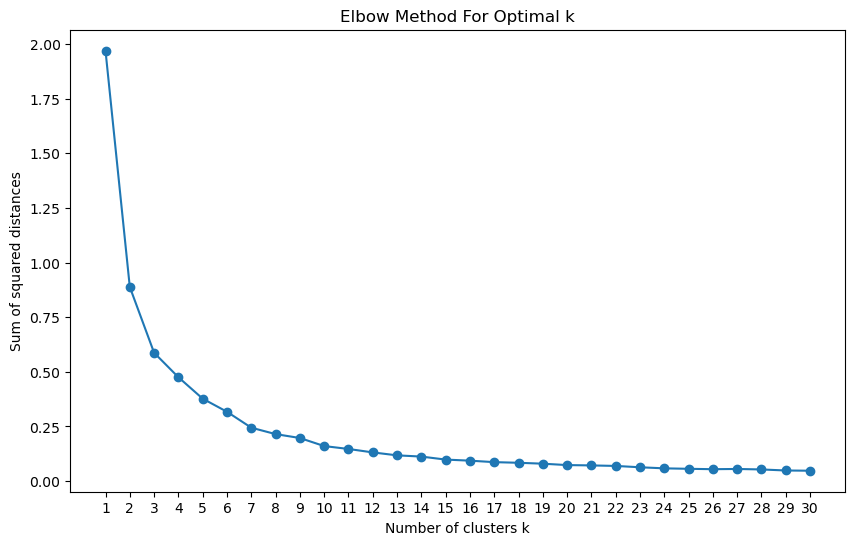

In [66]:
# Computes and visualizes the SSE curve for 1 to 30 clusters to identify the optimal K-Means cluster count using the elbow method
elbow_method(stations[['station_longitude', 'station_latitude']], 30)

In [67]:
# Performs final K-Means clustering with 20 clusters on station coordinates and stores the cluster labels (shifted by +1) as the final station cluster assignments
kmeans = KMeans(n_clusters=20, random_state=RANDOM_SEED)
kmeans.fit(stations[['station_latitude', 'station_longitude']])
stations['station_cluster'] = kmeans.labels_+1

In [68]:
# Saves the updated stations DataFrame, including all assigned cluster labels, back to the CSV file without an index
stations.to_csv('/Users/alexnaderspude/Desktop/Desktop/TUM MMT/DTU Kurs/Group Project/Trips_2018.csv', index=False)

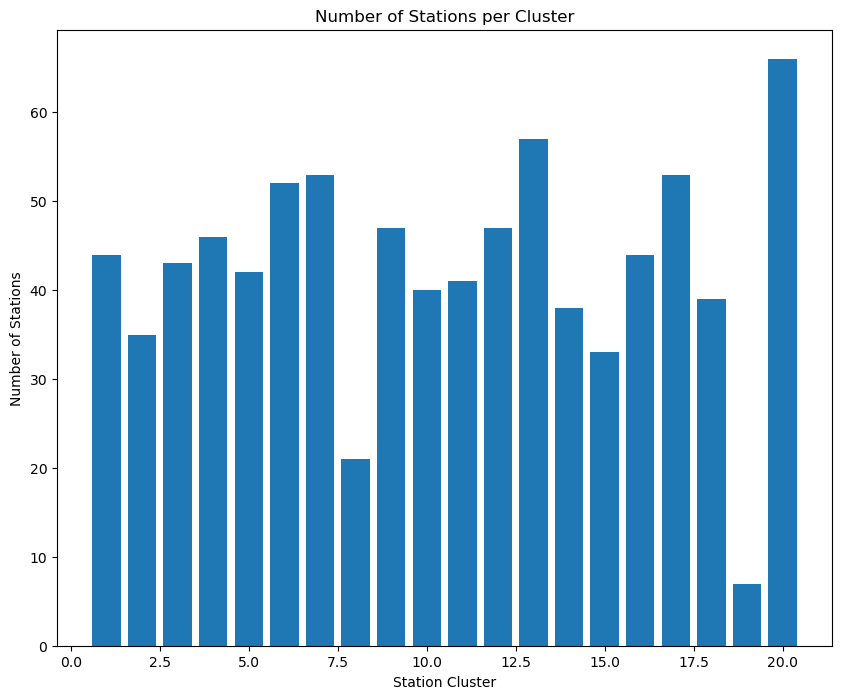

In [69]:
# Calculates the number of stations in each cluster and visualizes the distribution using a bar chart
sizes=stations.groupby('station_cluster').size()
fig = plt.figure(figsize=(10, 8))
plt.bar(sizes.index, sizes.values)
plt.xlabel('Station Cluster')
plt.ylabel('Number of Stations')
plt.title('Number of Stations per Cluster')
plt.show()

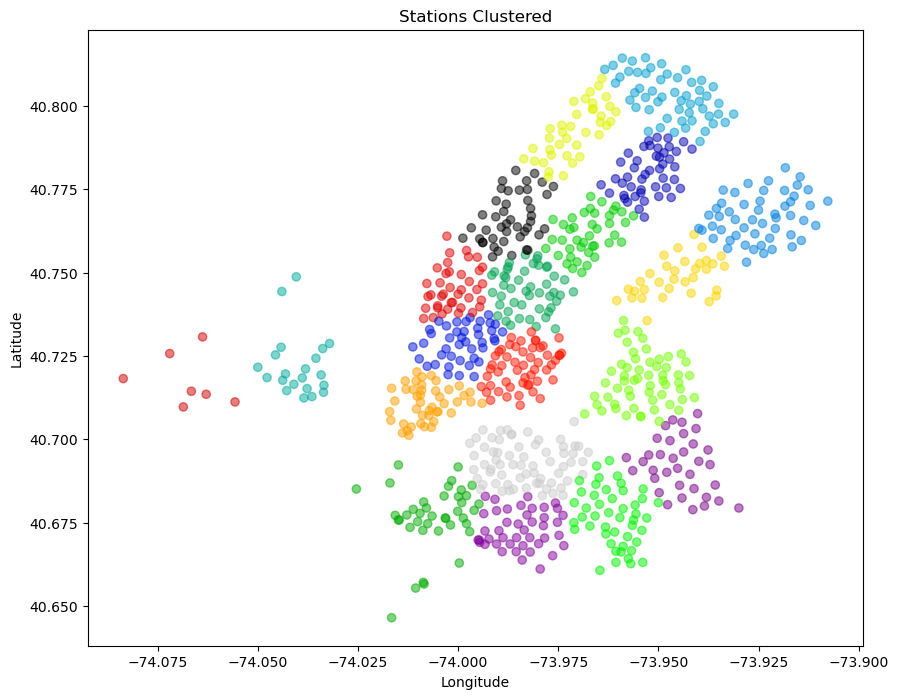

In [74]:
fig = plt.figure(figsize=(10, 8))
plt.scatter(stations['station_longitude'], stations['station_latitude'], c=stations['station_cluster'], cmap='nipy_spectral', alpha=0.5)
plt.title('Stations Clustered')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Correlation between hour of day and avg rentals: 0.498


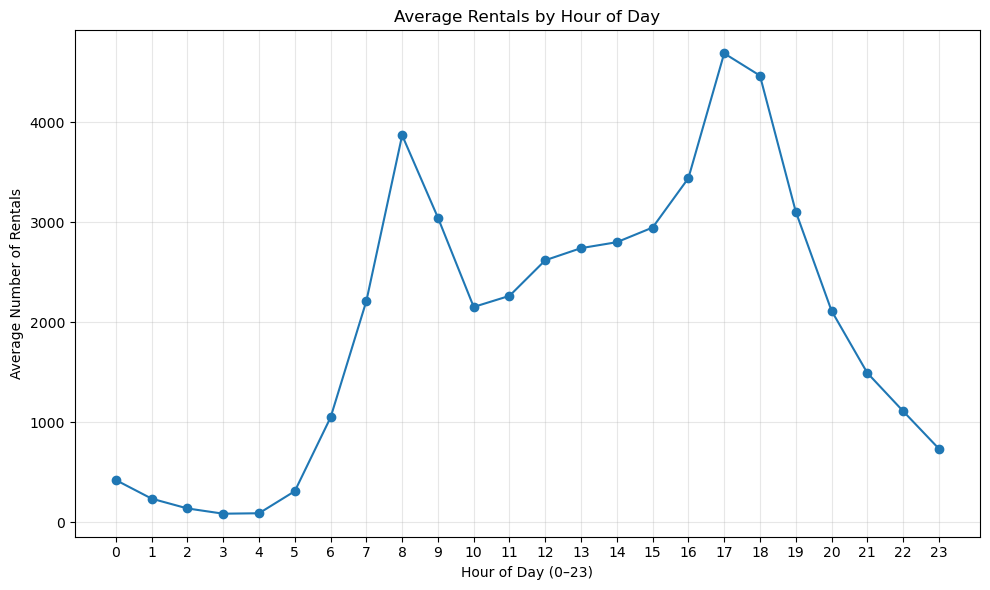

In [71]:
# Creates time-based pickup features, calculates the average number of rentals for each hour of the day, computes the correlation between hour-of-day and demand, and visualizes the hourly rental pattern in a line plot
# Create pickup features from starttime
data['pickup_datetime'] = pd.to_datetime(data['starttime'])
data['pickup_day'] = data['pickup_datetime'].dt.date
data['pickup_hour'] = data['pickup_datetime'].dt.hour   # 0..23

# Average rentals per hour over all days
bikes_per_slot = (
    data
    .groupby(['pickup_day', 'pickup_hour'])
    .size()
    .reset_index(name='num_rentals')
)

avg_per_hour = (
    bikes_per_slot
    .groupby('pickup_hour')['num_rentals']
    .mean()
    .reset_index(name='avg_num_rentals')
)

# Correlation between hour-of-day and average rentals
corr = avg_per_hour['pickup_hour'].corr(avg_per_hour['avg_num_rentals'])
print(f"Correlation between hour of day and avg rentals: {corr:.3f}")

# Plot: average rentals by hour-of-day
fig = plt.figure(figsize=(10, 6))
plt.plot(
    avg_per_hour['pickup_hour'],
    avg_per_hour['avg_num_rentals'],
    marker='o'
)
plt.xticks(range(0, 24))
plt.xlabel('Hour of Day (0–23)')
plt.ylabel('Average Number of Rentals')
plt.title('Average Rentals by Hour of Day')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/3720620322.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/3720620322.py:72: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(c + 1) for c in present_clusters])


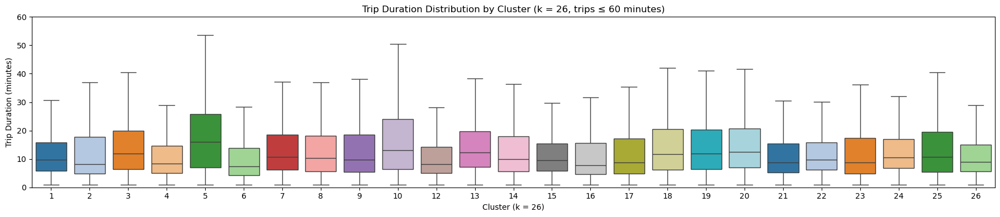

In [73]:
# --- K-means clustering with k = 26 on station coordinates ---------------------

k = 26

# Remove spatial outliers using z-score threshold
coords = stations[['station_latitude', 'station_longitude']].dropna()
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)

stations_k26 = stations.loc[mask_no_outliers].copy()

# Standardize coordinates and run K-Means
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_k26[['station_latitude', 'station_longitude']]
)

kmeans = KMeans(n_clusters=k, random_state=RANDOM_SEED)
stations_k26['cluster_k26'] = kmeans.fit_predict(coords_scaled)

# Color palette consistent with earlier cluster plots
palette = sns.color_palette('tab20', k)
color_map = {i: palette[i] for i in range(k)}

# Map each station_id to its assigned cluster  **(FIXED)**
cluster_map_26 = (
    stations_k26
    .drop_duplicates('station_id')
    .set_index('station_id')['cluster_k26']
)

# --- Attach cluster labels to trips and compute duration in minutes -----------

data_k26 = data.copy()
data_k26['cluster_k26'] = data_k26['start_station_id'].map(cluster_map_26)

# Remove trips whose start stations were outliers
data_k26 = data_k26.dropna(subset=['cluster_k26']).copy()
data_k26['cluster_k26'] = data_k26['cluster_k26'].astype(int)

data_k26['tripduration_min'] = data_k26['tripduration'] / 60.0

# --- Filter trips <= 60 minutes and create boxplots ---------------------------

cutoff = 60
df_box = data_k26[data_k26['tripduration_min'] <= cutoff].copy()

# Clusters with remaining data (0-based cluster IDs)
present_clusters = sorted(df_box['cluster_k26'].unique())

# Colors in the same order as plotted clusters
box_colors = [color_map[c] for c in present_clusters]

fig = plt.figure(figsize=(18, 4))
ax = sns.boxplot(
    x='cluster_k26',
    y='tripduration_min',
    data=df_box,
    order=present_clusters,
    palette=box_colors,
    showfliers=False
)

plt.xlabel('Cluster (k = 26)')
plt.ylabel('Trip Duration (minutes)')
plt.title(f'Trip Duration Distribution by Cluster (k = 26, trips ≤ {cutoff} minutes)')

plt.ylim(0, cutoff)
plt.yticks(np.arange(0, cutoff + 1, 10))

# Convert x-axis labels from 0-based IDs to 1..26
ax.set_xticklabels([str(c + 1) for c in present_clusters])

plt.tight_layout()
plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/279619437.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('start_station_id')


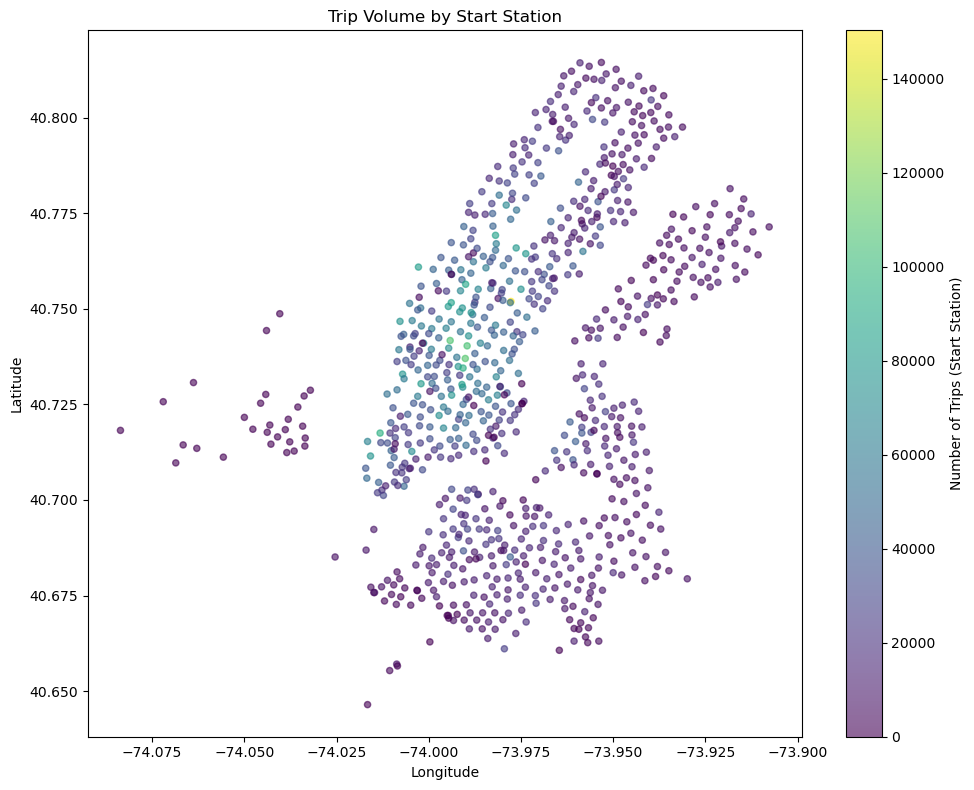

In [75]:
# Trips per start station
trips_per_station = (
    data
    .groupby('start_station_id')
    .size()
    .reset_index(name='num_trips')
)

# Join with station coordinates (matching earlier merging style)
stations_vol = (
    stations
    .merge(trips_per_station, left_on='station_id', right_on='start_station_id', how='left')
    .fillna({'num_trips': 0})
)

# Scatterplot of trip volume by station
fig, ax = plt.subplots(figsize=(10, 8))

sc = ax.scatter(
    stations_vol['station_longitude'],
    stations_vol['station_latitude'],
    c=stations_vol['num_trips'],
    cmap='viridis',
    alpha=0.6,
    s=20
)

plt.colorbar(sc, label='Number of Trips (Start Station)')
ax.set_title('Trip Volume by Start Station')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.tight_layout()
plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/20158832.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('start_station_id')
/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/20158832.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('end_station_id')


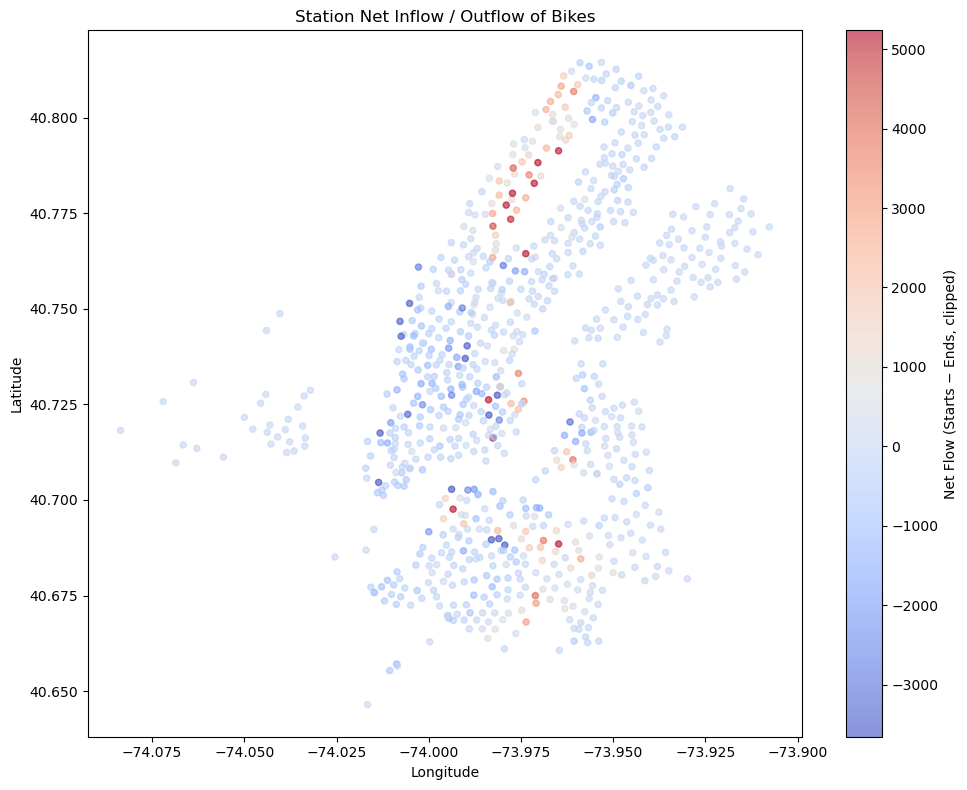

In [79]:
# Trips starting at each station
starts = (
    data
    .groupby('start_station_id')
    .size()
    .rename('num_starts')
)

# Trips ending at each station
ends = (
    data
    .groupby('end_station_id')
    .size()
    .rename('num_ends')
)

# Join with station coordinates (matching earlier merging style)
stations_flow = (
    stations
    .merge(starts, left_on='station_id', right_index=True, how='left')
    .merge(ends, left_on='station_id', right_index=True, how='left')
    .fillna({'num_starts': 0, 'num_ends': 0})
)

# Net flow = starts − ends
stations_flow['net_flow'] = stations_flow['num_starts'] - stations_flow['num_ends']

# Clip extreme net flows at 1st / 99th percentile to avoid skewed colors
low, high = stations_flow['net_flow'].quantile([0.01, 0.99])
stations_flow['net_flow_clipped'] = stations_flow['net_flow'].clip(low, high)

# Scatterplot of net flow by station (full dataset, no filtering)
fig, ax = plt.subplots(figsize=(10, 8))

sc = ax.scatter(
    stations_flow['station_longitude'],
    stations_flow['station_latitude'],
    c=stations_flow['net_flow_clipped'],
    cmap='coolwarm',
    alpha=0.6,
    s=20
)

plt.colorbar(sc, label='Net Flow (Starts − Ends, clipped)')
ax.set_title('Station Net Inflow / Outflow of Bikes')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.tight_layout()
plt.show()


# Red / orange stations → net_flow > 0 → more starts than ends
# These are net exporters of bikes (bikes tend to leave from here and end elsewhere).
# Blue stations → net_flow < 0 → more ends than starts
# These are net importers of bikes (bikes tend to arrive here and start elsewhere).
# Grey / neutral stations → net_flow ≈ 0 → starts and ends are roughly balanced.
# Because we clipped extreme values at the 1st / 99th percentile, the color scale is dominated by “normal” stations and not by a few huge outliers.


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/3729252648.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['start_station_id', 'is_weekend'])


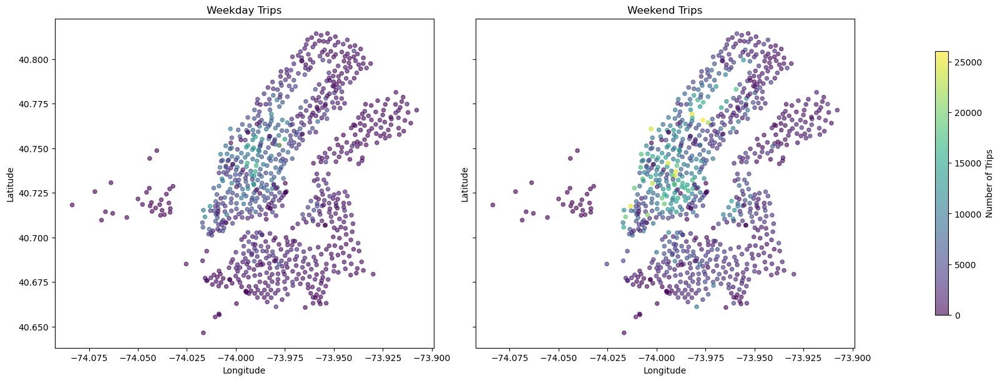

In [83]:
# Weekend / Weekday trip features
data['pickup_date'] = data['pickup_datetime'].dt.date
data['pickup_weekday'] = data['pickup_datetime'].dt.weekday
data['is_weekend'] = data['pickup_weekday'] >= 5

# Aggregate weekday and weekend trips per start station
station_week = (
    data
    .groupby(['start_station_id', 'is_weekend'])
    .size()
    .reset_index(name='num_trips')
    .pivot(index='start_station_id', columns='is_weekend', values='num_trips')
    .fillna(0)
    .rename(columns={False: 'weekday_trips', True: 'weekend_trips'})
    .reset_index()
)

# Merge with station coordinates
stations_week = (
    stations
    .merge(station_week, left_on='station_id', right_on='start_station_id', how='left')
    .fillna({'weekday_trips': 0, 'weekend_trips': 0})
)

# Use constrained layout to avoid overlap
fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 6),
    sharex=True,
    sharey=True,
    constrained_layout=True
)

# Plot weekday and weekend maps
for ax, col, title in zip(
    axes,
    ['weekday_trips', 'weekend_trips'],
    ['Weekday Trips', 'Weekend Trips']
):
    sc = ax.scatter(
        stations_week['station_longitude'],
        stations_week['station_latitude'],
        c=stations_week[col],
        cmap='viridis',
        alpha=0.6,
        s=20
    )
    ax.set_title(title)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

# Add colorbar outside the entire layout
cbar = fig.colorbar(sc, ax=axes, location='right', shrink=0.8, pad=0.08)
cbar.set_label('Number of Trips')

plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89115/2772381209.py:109: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


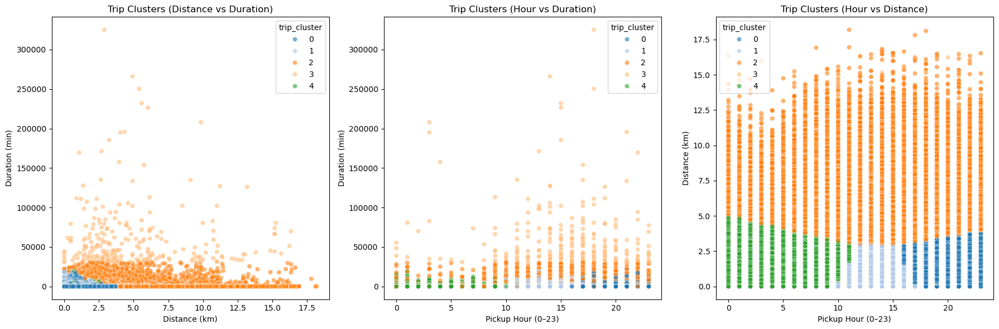

In [88]:
# --- 1. Prepare coordinate lookup from stations --------------------------------

coord_map = stations.set_index('station_id')[['station_latitude', 'station_longitude']]

data_trips = data.copy()

# Add coordinates for start and end stations
data_trips = data_trips.merge(
    coord_map.rename(columns={
        'station_latitude': 'start_lat',
        'station_longitude': 'start_lon'
    }),
    left_on='start_station_id',
    right_index=True,
    how='left'
)

data_trips = data_trips.merge(
    coord_map.rename(columns={
        'station_latitude': 'end_lat',
        'station_longitude': 'end_lon'
    }),
    left_on='end_station_id',
    right_index=True,
    how='left'
)

# Drop rows with missing coordinates
data_trips = data_trips.dropna(subset=['start_lat', 'end_lat']).copy()

# Haversine distance in kilometers
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Earth radius in km
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = (
        np.sin(dlat / 2)**2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    )
    return 2 * R * np.arcsin(np.sqrt(a))

data_trips['distance_km'] = haversine(
    data_trips['start_lat'],
    data_trips['start_lon'],
    data_trips['end_lat'],
    data_trips['end_lon']
)

# Convert trip duration to minutes
data_trips['duration_min'] = data_trips['tripduration'] / 60.0

trip_features = data_trips[['duration_min', 'distance_km', 'pickup_hour']].copy()
trip_features = trip_features.replace([np.inf, -np.inf], np.nan).dropna()

# Standardize features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(trip_features)

from sklearn.cluster import KMeans

k_trip = 5
kmeans_trip = KMeans(n_clusters=k_trip, random_state=RANDOM_SEED)
trip_labels = kmeans_trip.fit_predict(X_scaled)

data_trips['trip_cluster'] = trip_labels

import seaborn as sns

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

sns.scatterplot(
    x='distance_km', y='duration_min',
    hue='trip_cluster',
    palette='tab20',
    data=data_trips,
    alpha=0.6,
    ax=ax[0]
)
ax[0].set_title('Trip Clusters (Distance vs Duration)')
ax[0].set_xlabel('Distance (km)')
ax[0].set_ylabel('Duration (min)')

sns.scatterplot(
    x='pickup_hour', y='duration_min',
    hue='trip_cluster',
    palette='tab20',
    data=data_trips,
    alpha=0.6,
    ax=ax[1]
)
ax[1].set_title('Trip Clusters (Hour vs Duration)')
ax[1].set_xlabel('Pickup Hour (0–23)')
ax[1].set_ylabel('Duration (min)')

sns.scatterplot(
    x='pickup_hour', y='distance_km',
    hue='trip_cluster',
    palette='tab20',
    data=data_trips,
    alpha=0.6,
    ax=ax[2]
)
ax[2].set_title('Trip Clusters (Hour vs Distance)')
ax[2].set_xlabel('Pickup Hour (0–23)')
ax[2].set_ylabel('Distance (km)')

plt.tight_layout()
plt.show()


## DELETe

/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_89388/1165681680.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', k)


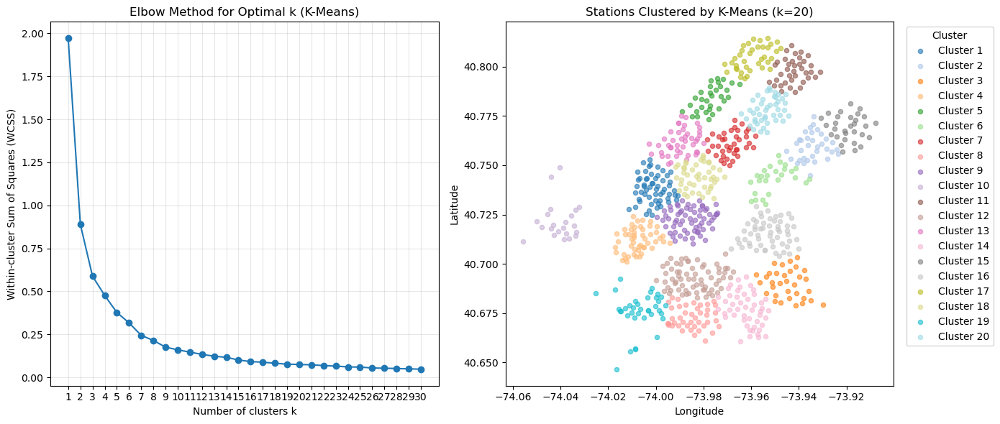

In [10]:
# Elbow method and K-Means clustering

def elbow_method(data, max_k):
    sse = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
    return sse


coords_for_clustering = stations[['start_station_longitude', 'start_station_latitude']]
sse = elbow_method(coords_for_clustering, max_k=30)

k = 20

coords = stations[['start_station_latitude', 'start_station_longitude']]
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)
stations_clean = stations[mask_no_outliers].copy()

kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(stations_clean[['start_station_latitude', 'start_station_longitude']])
stations_clean['station_cluster'] = kmeans.labels_ + 1



# Create side-by-side plots

fig, (ax_elbow, ax_map) = plt.subplots(1, 2, figsize=(14, 6))


# Left: Elbow plot
ax_elbow.plot(range(1, 31), sse, marker='o')
ax_elbow.set_title('Elbow Method for Optimal k (K-Means)')
ax_elbow.set_xlabel('Number of clusters k')
ax_elbow.set_ylabel('Within-cluster Sum of Squares (WCSS)')
ax_elbow.set_xticks(range(1, 31))
ax_elbow.grid(alpha=0.3)


# Right: K-Means scatter map
cmap = plt.cm.get_cmap('tab20', k)
for c in range(1, k + 1):
    m = stations_clean['station_cluster'] == c
    ax_map.scatter(
        stations_clean.loc[m, 'start_station_longitude'],
        stations_clean.loc[m, 'start_station_latitude'],
        color=cmap(c - 1),
        alpha=0.6,
        s=20,
        label=f'Cluster {c}'
    )

ax_map.set_title(f'Stations Clustered by K-Means (k={k})')
ax_map.set_xlabel('Longitude')
ax_map.set_ylabel('Latitude')
ax_map.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [6]:
# --- 1. IMPORTS AND HELPER PLOT FUNCTION --------------------------------------

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy import stats
from statsmodels.tsa.arima.model import ARIMA
from sklearn.preprocessing import StandardScaler
from matplotlib.lines import Line2D
from matplotlib import gridspec


data = pd.read_csv("/Users/alexnaderspude/Desktop/Desktop/TUM MMT/DTU Kurs/Group Project/Trips_2018.csv")


# Helper function: generic station cluster scatter plot
def plot_station_clusters(df, lon_col='station_longitude', lat_col='station_latitude', cluster_col='station_cluster'):
    """
    Scatterplot of stations colored by cluster.

    Parameters
    ----------
    df : pd.DataFrame
        Dataframe with station coordinates and a cluster label.
    lon_col : str
        Name of longitude column.
    lat_col : str
        Name of latitude column.
    cluster_col : str
        Name of cluster label column.
    """
    n_clusters = len(set(df[cluster_col]))
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.scatterplot(
        data=df,
        x=lon_col,
        y=lat_col,
        hue=cluster_col,
        palette='tab20',
        ax=ax,
        alpha=0.7
    )
    ax.set_title(f'Station Clusters (n={n_clusters})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [5]:
stations_start = data[['start_station_id', 'start_station_latitude', 'start_station_longitude']].drop_duplicates().rename(columns={
    'start_station_id': 'station_id',
    'start_station_latitude': 'station_latitude',
    'start_station_longitude': 'station_longitude'
})

stations_end = data[['end_station_id', 'end_station_latitude', 'end_station_longitude']].drop_duplicates().rename(columns={
    'end_station_id': 'station_id',
    'end_station_latitude': 'station_latitude',
    'end_station_longitude': 'station_longitude'
})

stations = pd.concat([stations_start, stations_end]).drop_duplicates().reset_index(drop=True)


NameError: name 'data' is not defined

## Load data and basic structure

## Clean station coordinates & deduplicate stations

## Top stations by number of records

## Elbow method (K-Means: choose k)

In [4]:
# --- Elbow (left) + K-Means scatter (right) in one figure -------------------

from sklearn.cluster import KMeans
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np

# 1) Elbow method ------------------------------------------------------------
def elbow_method(data, max_k):
    """
    Compute within-cluster sum of squares (SSE/WCSS) for k = 1..max_k.
    """
    sse = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)  # inertia_ = sum of squared distances to centroids
    return sse

coords_for_clustering = stations[['start_station_longitude', 'start_station_latitude']]
sse = elbow_method(coords_for_clustering, max_k=30)

# 2) Prepare data + model for k = 4 -----------------------------------------
k = 4  # number of clusters suggested by elbow

# Remove spatial outliers (only for clustering & plotting)
coords = stations[['start_station_latitude', 'start_station_longitude']]
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)
stations_clean = stations[mask_no_outliers].copy()

kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(stations_clean[['start_station_latitude', 'start_station_longitude']])
stations_clean['station_cluster'] = kmeans.labels_ + 1  # clusters start at 1

# 3) Create side-by-side plots ----------------------------------------------
fig, (ax_elbow, ax_map) = plt.subplots(1, 2, figsize=(14, 6))

# Left: Elbow plot
ax_elbow.plot(range(1, 31), sse, marker='o')
ax_elbow.set_title('Elbow Method for Optimal k (K-Means)')
ax_elbow.set_xlabel('Number of clusters k')
ax_elbow.set_ylabel('Within-cluster Sum of Squares (WCSS)')
ax_elbow.set_xticks(range(1, 31))
ax_elbow.grid(alpha=0.3)

# Right: K-Means clusters (k = 4)
cmap = plt.cm.get_cmap('tab20', k)
for c in range(1, k + 1):
    m = stations_clean['station_cluster'] == c
    ax_map.scatter(
        stations_clean.loc[m, 'start_station_longitude'],
        stations_clean.loc[m, 'start_station_latitude'],
        color=cmap(c - 1),
        alpha=0.6,
        s=20,
        label=f'Cluster {c}'
    )

ax_map.set_title(f'Stations Clustered by K-Means (k={k})')
ax_map.set_xlabel('Longitude')
ax_map.set_ylabel('Latitude')
ax_map.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)

plt.tight_layout()
plt.show()


NameError: name 'stations' is not defined

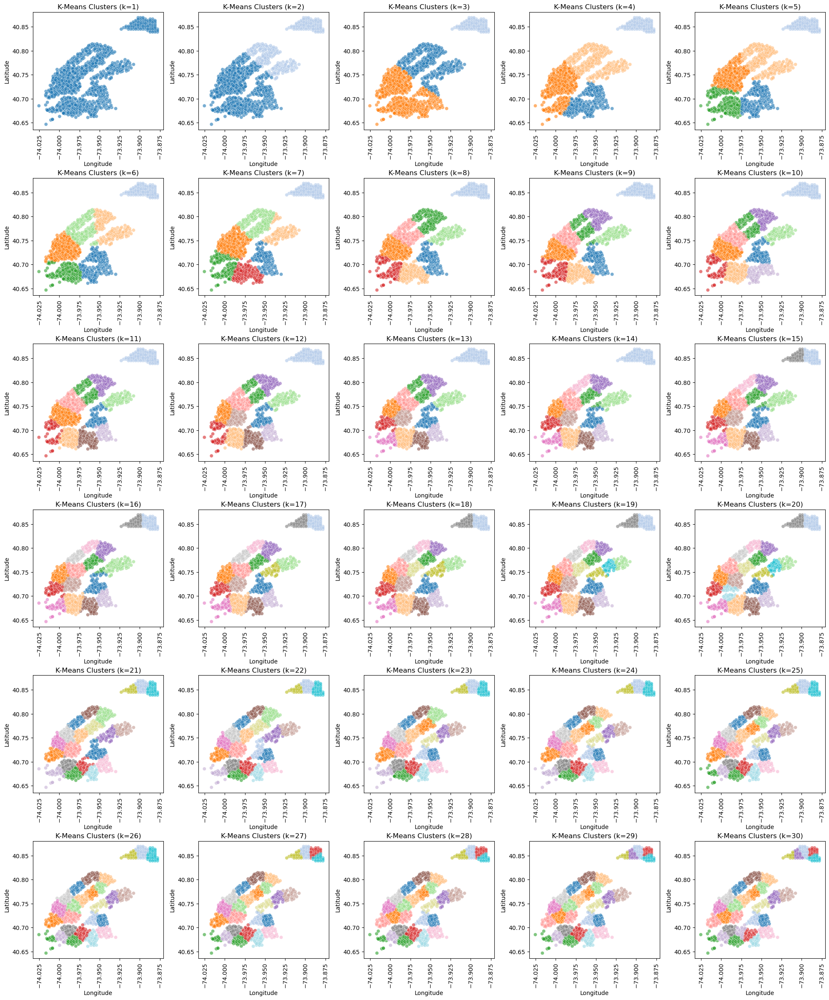

In [ ]:
# --- 8. K-MEANS CLUSTERS FOR k = 1..30 (GRID OF SCATTERPLOTS, OUTLIERS REMOVED) ---
# Chose to visualizae for more k values to see how clusters evolve

from sklearn.preprocessing import StandardScaler
from scipy import stats   # harmless if already imported

# 1) Take only lat/lon and drop missing values
coords = stations[['station_latitude', 'station_longitude']].dropna()

# 2) Detect outliers via z-score and keep points with |z| < 3 in BOTH dimensions
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)

# DataFrame for clustering/plotting without spatial outliers
stations_km = stations.loc[mask_no_outliers].copy()

# 3) Standardize lat/lon (normalization to zero mean / unit variance)
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_km[['station_latitude', 'station_longitude']]
)

# 4) Grid of scatter plots for k = 1..30  --> 6 rows x 5 columns
fig, ax = plt.subplots(6, 5, figsize=(20, 24))  # 6x5 = 30 subplots

for n_clusters in range(1, 31):    # k = 1..30
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(coords_scaled)                    # fit on standardized data
    stations_km['station_cluster_tmp'] = kmeans.labels_

    # Row/column index in 6x5 grid (5 columns)
    r = (n_clusters - 1) // 5
    c = (n_clusters - 1) % 5

    sns.scatterplot(
        data=stations_km,
        x='station_longitude',                  # original coordinates for map
        y='station_latitude',
        hue='station_cluster_tmp',
        palette='tab20',
        legend=False,
        ax=ax[r, c],
        alpha=0.6
    )
    ax[r, c].set_title(f'K-Means Clusters (k={n_clusters})')
    ax[r, c].set_xlabel('Longitude')
    ax[r, c].set_ylabel('Latitude')

    # Rotate longitude tick labels so they don't overlap
    ax[r, c].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()

# Clean up temporary column
stations_km.drop(columns=['station_cluster_tmp'], inplace=True)


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/1277095132.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20')  # same palette as scatter plots


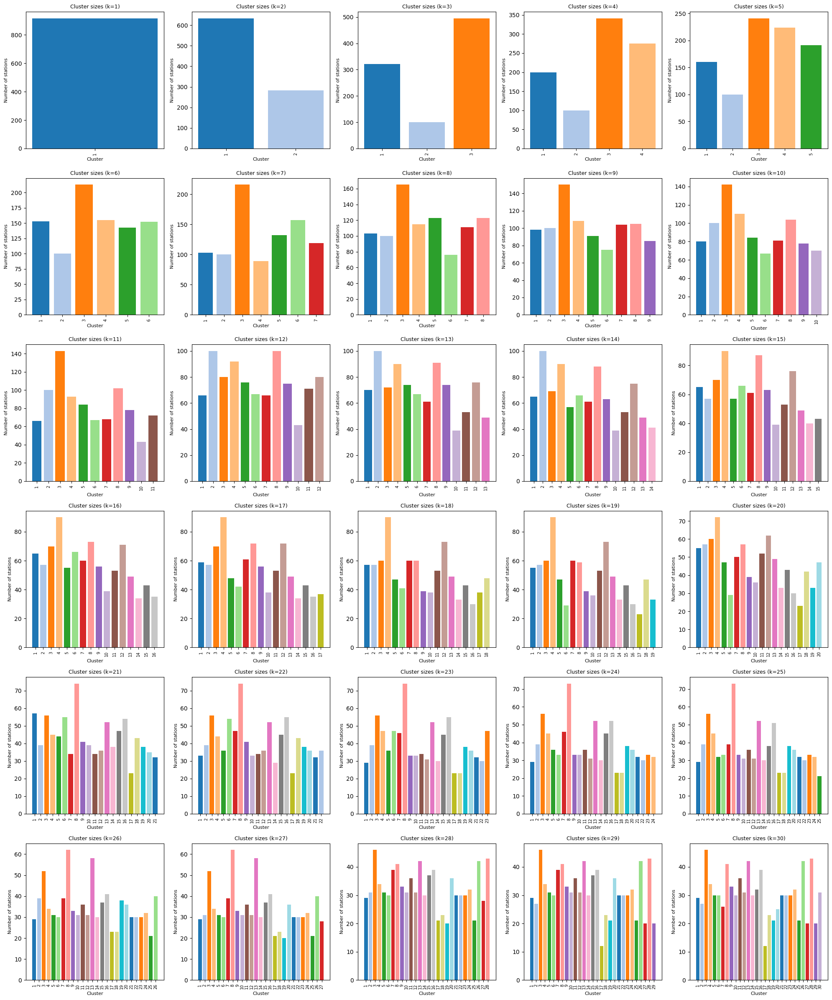

In [109]:
# 9. BAR CHART OF CLUSTER SIZES FOR k = 1..30 -------------------------------

# --- PREP: same data & preprocessing as in your k=1..30 scatter grid -----

# 1) Take only lat/lon and drop missing values
coords = stations[['station_latitude', 'station_longitude']].dropna()

# 2) Remove spatial outliers (|z| < 3 in both dimensions)
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)
stations_km = stations.loc[mask_no_outliers].copy()

# 3) Standardize lat/lon for K-Means
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_km[['station_latitude', 'station_longitude']]
)

# --- BAR GRID: cluster sizes for k = 1..30 --------------------------------

max_k = 30
fig, axes = plt.subplots(6, 5, figsize=(20, 24))  # 6x5 = 30 subplots
axes = axes.ravel()  # flatten to 1D index for convenience

cmap = plt.cm.get_cmap('tab20')  # same palette as scatter plots

for k in range(1, max_k + 1):
    ax = axes[k-1]

    # Fit K-Means for this k
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(coords_scaled)

    # Count stations per cluster
    cluster_sizes = np.bincount(labels, minlength=k)

    # x positions: 1..k (so first cluster is "1", not "0")
    x = np.arange(1, k + 1)

    # Colors: keep tab20, cycling if k > 20
    colors = [cmap(i % 20) for i in range(k)]

    ax.bar(x, cluster_sizes, color=colors)

    ax.set_title(f'Cluster sizes (k={k})', fontsize=9)
    ax.set_ylabel('Number of stations', fontsize=8)

    # Use cluster numbers 1..k as tick labels, rotated 90°
    ax.set_xticks(x)
    ax.set_xticklabels([str(i) for i in x], rotation=90, fontsize=7)
    ax.set_xlabel('Cluster', fontsize=8)

plt.tight_layout()
plt.show()


## K-Means clustering and plots

/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/339134079.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


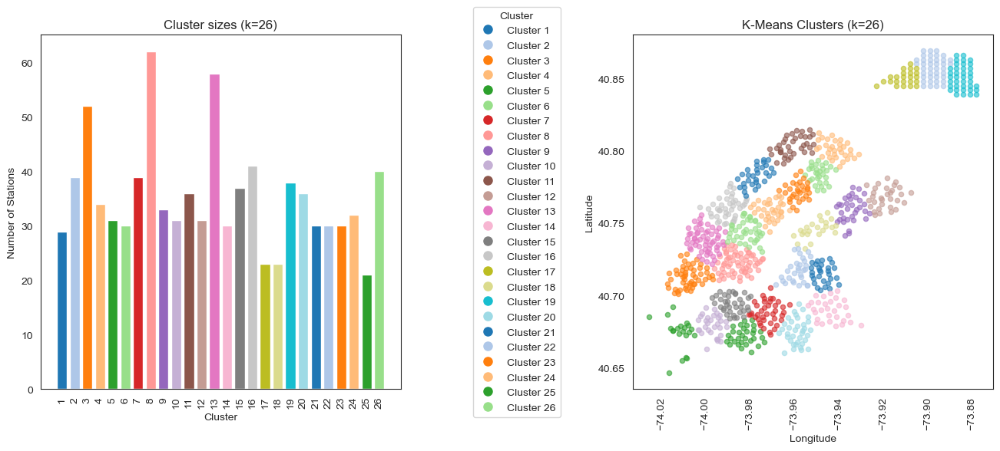

In [128]:
# --- 10. COMBINED FIGURE: CLUSTER SIZES | LEGEND | K-MEANS SCATTER (k = 26) ---

k = 26

# 1) Prepare data: remove outliers and standardize coordinates
coords = stations[['station_latitude', 'station_longitude']].dropna()
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)

stations_k26 = stations.loc[mask_no_outliers].copy()

scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_k26[['station_latitude', 'station_longitude']]
)

# 2) Fit K-Means with k = 26
kmeans = KMeans(n_clusters=k, random_state=42)
stations_k26['cluster_k26'] = kmeans.fit_predict(coords_scaled)

# 3) Shared color palette for all three elements
palette = sns.color_palette('tab20', k)
color_map = {c: palette[c] for c in range(k)}

# Cluster sizes for bar chart
sizes = stations_k26.groupby('cluster_k26').size().sort_index()
clusters_1based = sizes.index + 1

# 4) Figure with three panels: bar | legend | scatter
fig = plt.figure(figsize=(16, 6))
gs = gridspec.GridSpec(1, 3, width_ratios=[3, 0.8, 3], wspace=0.25)

ax_bar     = fig.add_subplot(gs[0, 0])  # LEFT  : cluster sizes
ax_legend  = fig.add_subplot(gs[0, 1])  # MIDDLE: legend
ax_scatter = fig.add_subplot(gs[0, 2])  # RIGHT : k-means scatter

# --- Left: cluster-size bar chart (same colors) ---
bar_colors = [color_map[c] for c in sizes.index]

ax_bar.bar(clusters_1based, sizes.values, color=bar_colors)
ax_bar.set_title(f'Cluster sizes (k={k})')
ax_bar.set_xlabel('Cluster')
ax_bar.set_ylabel('Number of Stations')

# show *every* cluster label on the x-axis (1, 2, 3, ..., 26)
ax_bar.set_xticks(clusters_1based)
ax_bar.set_xticklabels([str(c) for c in clusters_1based])

for tick in ax_bar.get_xticklabels():
    tick.set_rotation(90)

# --- Middle: legend with round markers (keep border) ---
ax_legend.axis('off')

legend_handles = [
    Line2D(
        [0], [0],
        marker='o',
        linestyle='',
        markersize=8,
        markerfacecolor=color_map[c],
        markeredgecolor=color_map[c]
    )
    for c in range(k)
]
legend_labels = [f'Cluster {c+1}' for c in range(k)]

leg = ax_legend.legend(
    legend_handles,
    legend_labels,
    title='Cluster',
    loc='center',
    frameon=True  # keep border
)
leg.get_frame().set_facecolor('white')

# --- Right: K-Means scatter plot ---
for c in range(k):
    m = stations_k26['cluster_k26'] == c
    ax_scatter.scatter(
        stations_k26.loc[m, 'station_longitude'],
        stations_k26.loc[m, 'station_latitude'],
        color=color_map[c],
        s=20,
        alpha=0.6
    )

ax_scatter.set_title(f'K-Means Clusters (k={k})')
ax_scatter.set_xlabel('Longitude')
ax_scatter.set_ylabel('Latitude')
for tick in ax_scatter.get_xticklabels():
    tick.set_rotation(90)

plt.tight_layout()
plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/2206332269.py:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/2206332269.py:68: UserWarning: The palette list has more values (26) than needed (24), which may not be intended.
  sns.boxplot(
/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/2206332269.py:88: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(i + 1) for i in range(k)])


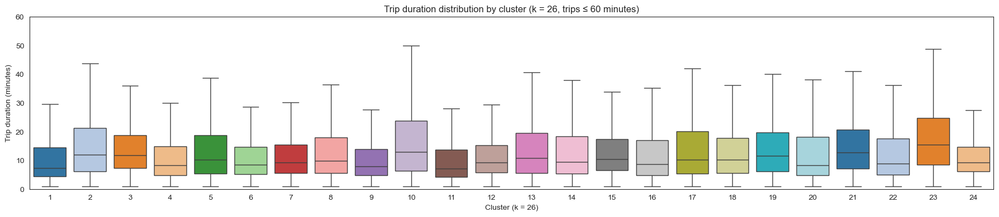

In [187]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------------------
# 1. K-means clustering with k = 26 on station coordinates (same as before)
# ---------------------------------------------------------------------
k = 26

# Use the renamed coordinate columns
coords = stations[['station_latitude', 'station_longitude']].dropna()

# Remove spatial outliers (|z| < 3 on both dimensions)
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)

stations_k26 = stations.loc[mask_no_outliers].copy()

# Standardize lat/lon
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_k26[['station_latitude', 'station_longitude']]
)

# Fit K-Means
kmeans = KMeans(n_clusters=k, random_state=42)
stations_k26['cluster_k26'] = kmeans.fit_predict(coords_scaled)

# Map each start_station_id to a unique cluster (one row per station)
cluster_map_26 = (
    stations_k26
    .drop_duplicates('start_station_id')
    .set_index('start_station_id')['cluster_k26']
)

# ---------------------------------------------------------------------
# 2. Attach cluster labels to trips and compute trip duration in minutes
# ---------------------------------------------------------------------
data_k26 = data.copy()

# add cluster_k26 to each trip based on its start_station_id
data_k26['cluster_k26'] = data_k26['start_station_id'].map(cluster_map_26)

# drop trips whose start station was removed as an outlier
data_k26 = data_k26.dropna(subset=['cluster_k26']).copy()
data_k26['cluster_k26'] = data_k26['cluster_k26'].astype(int)   # 0..25

# trip duration in minutes
data_k26['tripduration_min'] = data_k26['tripduration'] / 60.0

# ---------------------------------------------------------------------
# 3. Filter to trips <= 60 minutes
# ---------------------------------------------------------------------
cutoff = 60  # minutes
df_box = data_k26[data_k26['tripduration_min'] <= cutoff].copy()

# ---------------------------------------------------------------------
# 4. Boxplots with the EXACT same colors as in the cluster-size / scatter fig
# ---------------------------------------------------------------------
# Same palette as used for the bar+scatter figure
palette = sns.color_palette('tab20', k)   # palette[0] is cluster 0, ..., palette[25] is cluster 25

plt.figure(figsize=(18, 4))

sns.boxplot(
    x='cluster_k26',
    y='tripduration_min',
    data=df_box,
    order=sorted(df_box['cluster_k26'].unique()),  # ensure clusters 0..25 in order
    palette=palette,       # use the same 26 colors in the same order
    showfliers=False       # do not draw points beyond the whiskers
)

plt.xlabel('Cluster (k = 26)')
plt.ylabel('Trip duration (minutes)')
plt.title(f'Trip duration distribution by cluster (k = 26, trips ≤ {cutoff} minutes)')

# y-axis from 0 to 60 and show tick at 60
plt.ylim(0, cutoff)
plt.yticks(np.arange(0, cutoff + 1, 10))   # ticks at 0, 10, ..., 60

# Show cluster labels as 1..26 instead of 0..25 ON THE AXIS ONLY.
# Internally the clusters are still 0..25, which keeps the color mapping correct.
ax = plt.gca()
ax.set_xticklabels([str(i + 1) for i in range(k)])

plt.tight_layout()
plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/2313632900.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/2313632900.py:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(c + 1) for c in present_clusters])


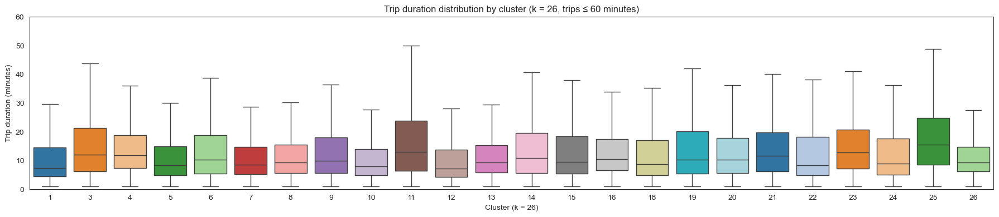

In [196]:
# --- IMPORTANT NOTE ABOUT "MISSING" CLUSTERS ---------------------------------
# After the steps above, some clusters (e.g. 2 or 17) can end up with **no trips**
# in data_k26 for the following reasons:
#   1) All stations that originally belonged to that cluster were removed as
#      spatial outliers before clustering or mapping.
#   2) Those stations do exist, but all trips starting from them have a trip
#      duration > cutoff (60 minutes in our case) and are filtered out below.
# Seaborn’s boxplot only draws boxes for categories that actually have data
# points in the DataFrame. If a cluster has zero remaining rows after filtering,
# it simply doesn’t appear in the plot.

# --- 1. K-means clustering with k = 26 on station coordinates -----------------
k = 26

coords = stations[['station_latitude', 'station_longitude']].dropna()

# Remove spatial outliers (|z| < 3 on both dimensions)
z_scores = np.abs(stats.zscore(coords))
mask_no_outliers = (z_scores < 3).all(axis=1)
stations_k26 = stations.loc[mask_no_outliers].copy()

# Standardize lat/lon and fit K-Means
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(
    stations_k26[['station_latitude', 'station_longitude']]
)
kmeans = KMeans(n_clusters=k, random_state=42)
stations_k26['cluster_k26'] = kmeans.fit_predict(coords_scaled)

# Shared color palette, identical to your combined figure
palette = sns.color_palette('tab20', k)
color_map = {c: palette[c] for c in range(k)}   # 0..25 -> color

# Map each start_station_id to a unique cluster
cluster_map_26 = (
    stations_k26
    .drop_duplicates('start_station_id')
    .set_index('start_station_id')['cluster_k26']
)

# --- 2. Attach cluster labels to trips and compute duration in minutes --------
data_k26 = data.copy()
data_k26['cluster_k26'] = data_k26['start_station_id'].map(cluster_map_26)

# Drop trips whose start station was removed as an outlier
data_k26 = data_k26.dropna(subset=['cluster_k26']).copy()
data_k26['cluster_k26'] = data_k26['cluster_k26'].astype(int)

data_k26['tripduration_min'] = data_k26['tripduration'] / 60.0

# --- 3. Filter to trips <= 60 minutes and make boxplots -----------------------
cutoff = 60
df_box = data_k26[data_k26['tripduration_min'] <= cutoff].copy()

# Clusters that actually have data after the cutoff (0-based ids)
present_clusters = sorted(df_box['cluster_k26'].unique())

# Colors in the same order as the clusters we are plotting
box_colors = [color_map[c] for c in present_clusters]

plt.figure(figsize=(18, 4))
ax = sns.boxplot(
    x='cluster_k26',
    y='tripduration_min',
    data=df_box,
    order=present_clusters,   # only these clusters appear (2,17 omitted if empty)
    palette=box_colors,       # same colors as bar+scatter, aligned with order
    showfliers=False          # do not draw individual outlier points
)

plt.xlabel('Cluster (k = 26)')
plt.ylabel('Trip duration (minutes)')
plt.title(f'Trip duration distribution by cluster (k = 26, trips ≤ {cutoff} minutes)')

# y-axis from 0 to 60 with tick at 60
plt.ylim(0, cutoff)
plt.yticks(np.arange(0, cutoff + 1, 10))

# Relabel x-axis from 0-based IDs to 1..26
ax.set_xticklabels([str(c + 1) for c in present_clusters])

plt.tight_layout()
plt.show()


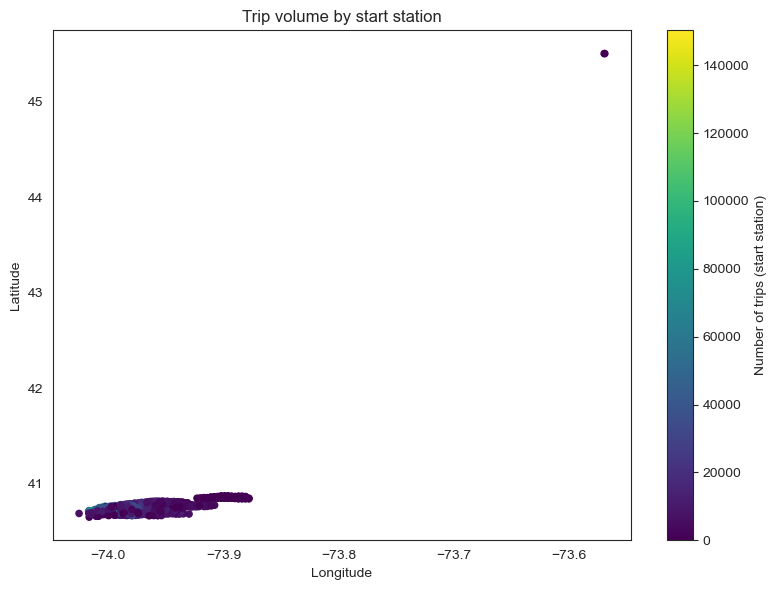

In [212]:
# 1) Trips per start station
trips_per_station = (
    data
    .groupby('start_station_id')
    .size()
    .reset_index(name='num_trips')
)

# 2) Join with station coordinates
stations_vol = stations.merge(
    trips_per_station,
    on='start_station_id',
    how='left'
).fillna({'num_trips': 0})

plt.figure(figsize=(8, 6))
sc = plt.scatter(
    stations_vol['station_longitude'],
    stations_vol['station_latitude'],
    c=stations_vol['num_trips'],
    s=20,
    cmap='viridis'
)
plt.colorbar(sc, label='Number of trips (start station)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Trip volume by start station')
plt.tight_layout()
plt.show()


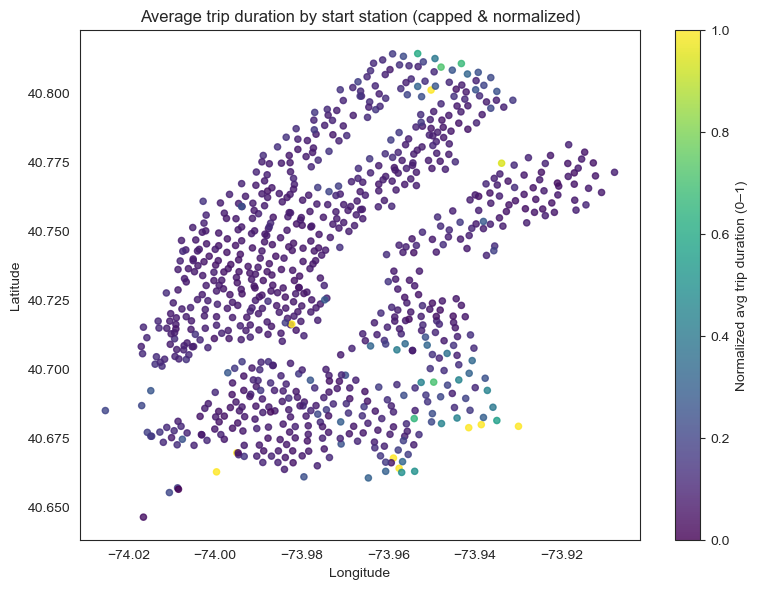

In [199]:
from sklearn.preprocessing import MinMaxScaler
from scipy import stats

# --------------------------------------------------------
# 1) Remove spatial outlier stations (same logic as before)
# --------------------------------------------------------
# We assume `stations` has one row per station with lat/lon (NYC + that far-away station)
coords = stations[['station_latitude', 'station_longitude']].dropna()

# z-score filter: keep stations where both lat & lon are within |z| < 3
z_scores = np.abs(stats.zscore(coords))
mask_geo = (z_scores < 3).all(axis=1)

stations_clean = stations.loc[mask_geo].copy()

# --------------------------------------------------------
# 2) Compute average trip duration per *start* station
# --------------------------------------------------------
# Merge trips with station coordinates (only for stations that passed the geo filter)
data_geo = data.merge(
    stations_clean[['start_station_id', 'station_latitude', 'station_longitude']],
    on='start_station_id',
    how='inner'
)

# Trip duration in minutes
data_geo['tripduration_min'] = data_geo['tripduration'] / 60.0

# Average trip duration per start station
avg_by_station = (
    data_geo
    .groupby(['start_station_id', 'station_latitude', 'station_longitude'])['tripduration_min']
    .mean()
    .reset_index(name='avg_tripduration_min')
)

# -----------------------------------------------------------------
# 3) Cap extreme values (e.g. 99th percentile) so outliers don't
#    dominate the color scale after normalization
# -----------------------------------------------------------------
q99 = avg_by_station['avg_tripduration_min'].quantile(0.99)

# Clip values above the 99th percentile
avg_by_station['avg_tripduration_capped'] = avg_by_station['avg_tripduration_min'].clip(upper=q99)

# --------------------------------------------------------
# 4) Min–max normalize the *capped* average durations to [0, 1]
# --------------------------------------------------------
scaler = MinMaxScaler()
avg_by_station['avg_tripduration_norm'] = scaler.fit_transform(
    avg_by_station[['avg_tripduration_capped']]
)

# --------------------------------------------------------
# 5) Plot: normalized average trip duration vs. longitude/latitude
# --------------------------------------------------------
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    avg_by_station['station_longitude'],
    avg_by_station['station_latitude'],
    c=avg_by_station['avg_tripduration_norm'],
    cmap='viridis',
    s=20,
    alpha=0.8
)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average trip duration by start station (capped & normalized)')

cbar = plt.colorbar(scatter)
cbar.set_label('Normalized avg trip duration (0–1)')

plt.tight_layout()
plt.show()


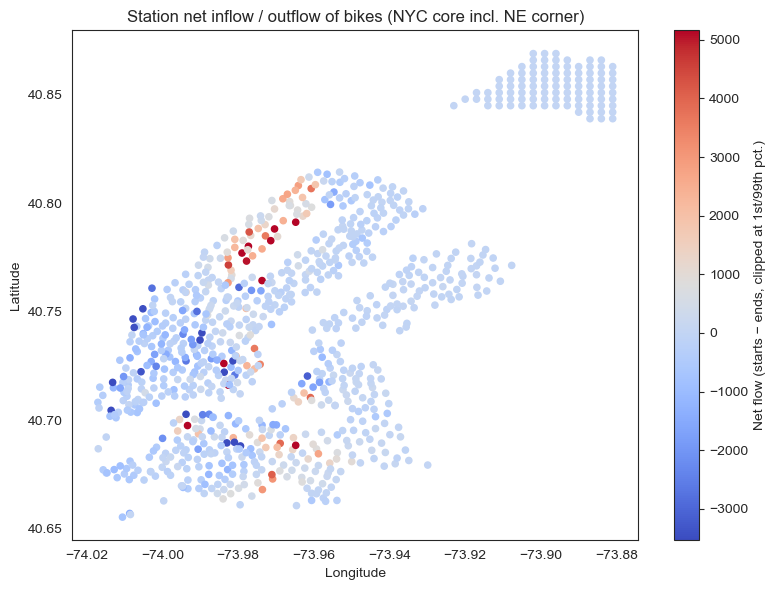

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- 1. Trips starting / ending at each station -----------------------

starts = (
    data
    .groupby('start_station_id')
    .size()
    .rename('num_starts')
)

ends = (
    data
    .groupby('end_station_id')
    .size()
    .rename('num_ends')
)

balance = (
    stations
    .set_index('start_station_id')
    .join(starts)
    .join(ends, how='left')
    .fillna({'num_starts': 0, 'num_ends': 0})
)

balance['net_flow'] = balance['num_starts'] - balance['num_ends']

# ---------- 2. Keep NYC core *including* NE corner --------------------------
# Lat ~40.65–40.87 includes Manhattan + NE cluster but excludes the far 45° outlier
# Lon ~-74.02–-73.88 keeps the core and the NE cluster, but drops the distant station.

core_mask = (
    (balance['station_latitude'].between(40.65, 40.87)) &
    (balance['station_longitude'].between(-74.02, -73.88))
)

balance_core = balance[core_mask].copy()

# ---------- 3. Clip colour scale to tame extreme net flows ------------------

low, high = balance_core['net_flow'].quantile([0.01, 0.99])
balance_core['net_flow_clipped'] = balance_core['net_flow'].clip(low, high)

# ---------- 4. Plot ---------------------------------------------------------

plt.figure(figsize=(8, 6))
sc = plt.scatter(
    balance_core['station_longitude'],
    balance_core['station_latitude'],
    c=balance_core['net_flow_clipped'],
    s=20,
    cmap='coolwarm'
)

cbar = plt.colorbar(sc)
cbar.set_label('Net flow (starts − ends, clipped at 1st/99th pct.)')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Station net inflow / outflow of bikes (NYC core incl. NE corner)')

plt.tight_layout()
plt.show()



# Red / orange stations → net_flow > 0 → more starts than ends
# These are net exporters of bikes (bikes tend to leave from here and end elsewhere).
# Blue stations → net_flow < 0 → more ends than starts
# These are net importers of bikes (bikes tend to arrive here and start elsewhere).
# Grey / neutral stations → net_flow ≈ 0 → starts and ends are roughly balanced.
# Because we clipped extreme values at the 1st / 99th percentile, the color scale is dominated by “normal” stations and not by a few huge outliers.

Correlation between hour of day and avg rentals: 0.498


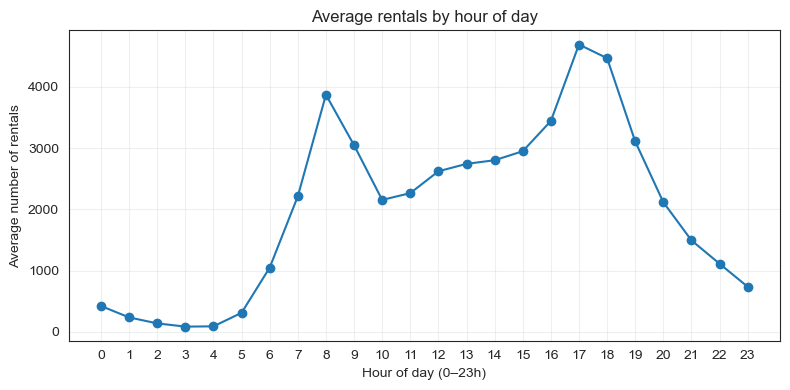

In [206]:
# If not already done: create pickup_datetime, pickup_day and pickup_hour from starttime
data['pickup_datetime'] = pd.to_datetime(data['starttime'])
data['pickup_day'] = data['pickup_datetime'].dt.date
data['pickup_hour'] = data['pickup_datetime'].dt.hour  # 0..23

# Average rentals per hour over days (per day+hour slot)
bikes_per_slot = (
    data
    .groupby(['pickup_day', 'pickup_hour'])
    .size()
    .reset_index(name='num_rentals')
)

avg_per_hour = (
    bikes_per_slot
    .groupby('pickup_hour')['num_rentals']
    .mean()
    .reset_index(name='avg_num_rentals')
)

# 2) Correlation between hour of day and average rentals
corr = avg_per_hour['pickup_hour'].corr(avg_per_hour['avg_num_rentals'])
print(f"Correlation between hour of day and avg rentals: {corr:.3f}")

# 3) Plot: hour-of-day vs. average rentals
plt.figure(figsize=(8, 4))
plt.plot(
    avg_per_hour['pickup_hour'],
    avg_per_hour['avg_num_rentals'],
    marker='o'
)
plt.xticks(range(0, 24))  # show all hours 0..23
plt.xlabel('Hour of day (0–23h)')
plt.ylabel('Average number of rentals')
plt.title('Average rentals by hour of day')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


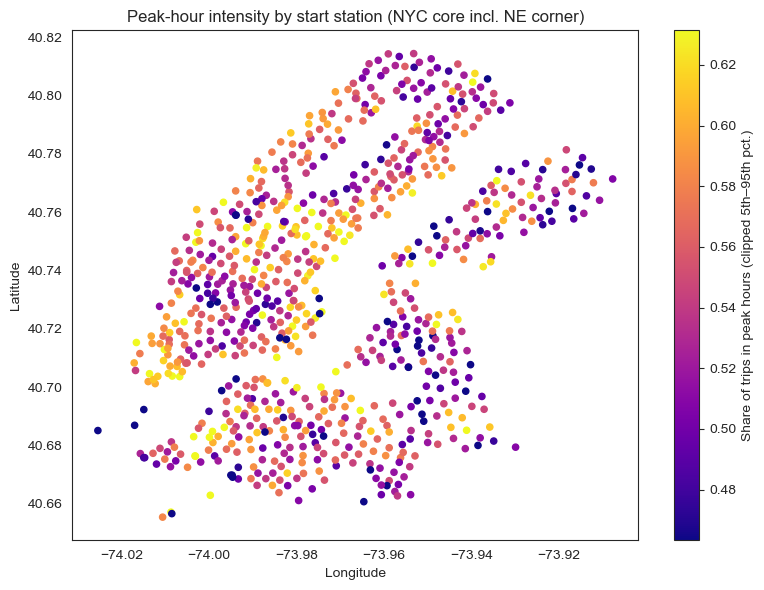

In [222]:
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Prepare datetime + hour ----------------------------------------------

data['pickup_datetime'] = pd.to_datetime(data['starttime'])
data['pickup_hour'] = data['pickup_datetime'].dt.hour  # 0..23

# --- 2. Define peak hours (7–10 and 16–19) -----------------------------------

peak_mask = (
    data['pickup_hour'].between(7, 10) |   # 7, 8, 9, 10
    data['pickup_hour'].between(16, 19)    # 16, 17, 18, 19
)

# --- 3. Count total vs. peak trips per start station -------------------------

total_by_station = (
    data
    .groupby('start_station_id')
    .size()
    .rename('total_trips')
)

peak_by_station = (
    data[peak_mask]
    .groupby('start_station_id')
    .size()
    .rename('peak_trips')
)

peak_share = (
    stations
    .set_index('start_station_id')
    .join(total_by_station)
    .join(peak_by_station, how='left')
    .fillna({'total_trips': 0, 'peak_trips': 0})
)

# Keep only stations that actually have trips
peak_share = peak_share[peak_share['total_trips'] > 0].copy()

# Share of trips that occur in peak hours (0–1)
peak_share['peak_share'] = peak_share['peak_trips'] / peak_share['total_trips']

# --- 4. Restrict to NYC core *including* NE corner ---------------------------
# We drop the far-away upstate outlier, but keep everything in 40.65–40.87 N
# and -74.03–-73.86 W. The upper bound 40.87 explicitly covers the NE stations.

core_mask = (
    (peak_share['station_latitude']  >= 40.65) &
    (peak_share['station_latitude']  <= 40.87) &   # high enough for NE corner
    (peak_share['station_longitude'] >= -74.03) &
    (peak_share['station_longitude'] <= -73.86)
)

peak_share_core = peak_share[core_mask].copy()

# --- 5. Clip colours (5th–95th percentile) to avoid colour scale dominated
# by a few extreme stations, but still plot *all* of them ----------------------

low, high = peak_share_core['peak_share'].quantile([0.05, 0.95])
peak_share_core['peak_share_clipped'] = peak_share_core['peak_share'].clip(low, high)

# --- 6. Plot peak-hour intensity ---------------------------------------------

plt.figure(figsize=(8, 6))

sc = plt.scatter(
    peak_share_core['station_longitude'],
    peak_share_core['station_latitude'],
    c=peak_share_core['peak_share_clipped'],  # use clipped values for colour
    s=20,
    cmap='plasma'
)

cbar = plt.colorbar(sc)
cbar.set_label('Share of trips in peak hours (clipped 5th–95th pct.)')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Peak-hour intensity by start station (NYC core incl. NE corner)')

# No manual xlim/ylim: the extents come from the filtered data
plt.tight_layout()
plt.show()


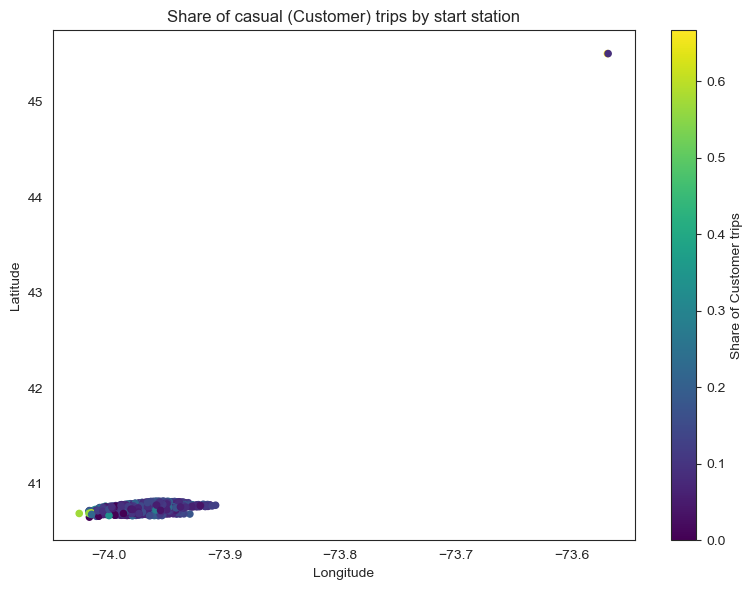

In [213]:
# Share of 'Customer' trips per station
user_counts = (
    data
    .groupby(['start_station_id', 'usertype'])
    .size()
    .unstack(fill_value=0)
)

user_counts['total'] = user_counts.sum(axis=1)
user_counts['customer_share'] = user_counts.get('Customer', 0) / user_counts['total']

user_spatial = (
    stations
    .set_index('start_station_id')
    .join(user_counts[['customer_share']], how='inner')
)

plt.figure(figsize=(8, 6))
sc = plt.scatter(
    user_spatial['station_longitude'],
    user_spatial['station_latitude'],
    c=user_spatial['customer_share'],
    s=20,
    cmap='viridis'
)
plt.colorbar(sc, label='Share of Customer trips')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Share of casual (Customer) trips by start station')
plt.tight_layout()
plt.show()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/485384689.py:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


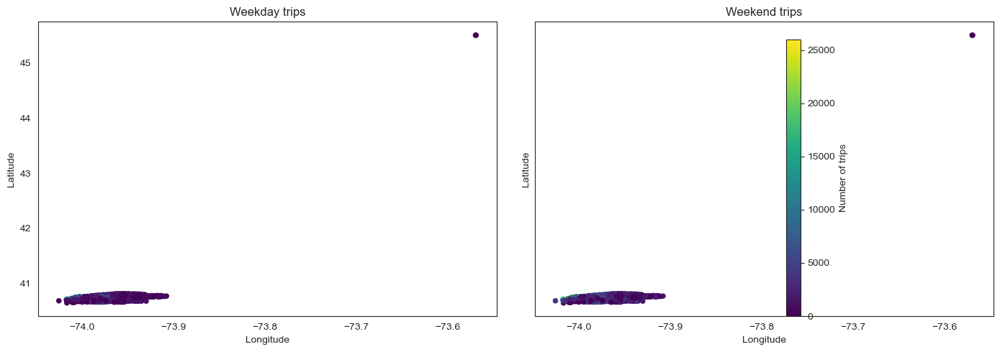

In [214]:
data['pickup_date'] = data['pickup_datetime'].dt.date
data['pickup_weekday'] = data['pickup_datetime'].dt.weekday  # 0 = Mon, 6 = Sun
data['is_weekend'] = data['pickup_weekday'] >= 5

# Aggregate trips per station & weekend flag
station_week = (
    data
    .groupby(['start_station_id', 'is_weekend'])
    .size()
    .reset_index(name='num_trips')
    .pivot(index='start_station_id', columns='is_weekend', values='num_trips')
    .fillna(0)
    .rename(columns={False: 'weekday_trips', True: 'weekend_trips'})
)

station_week = stations.set_index('start_station_id').join(station_week, how='inner')

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)

for ax, col, title in zip(
    axes,
    ['weekday_trips', 'weekend_trips'],
    ['Weekday trips', 'Weekend trips']
):
    sc = ax.scatter(
        station_week['station_longitude'],
        station_week['station_latitude'],
        c=station_week[col],
        s=20,
        cmap='viridis'
    )
    ax.set_title(title)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

fig.colorbar(sc, ax=axes.ravel().tolist(), label='Number of trips')
plt.tight_layout()
plt.show()


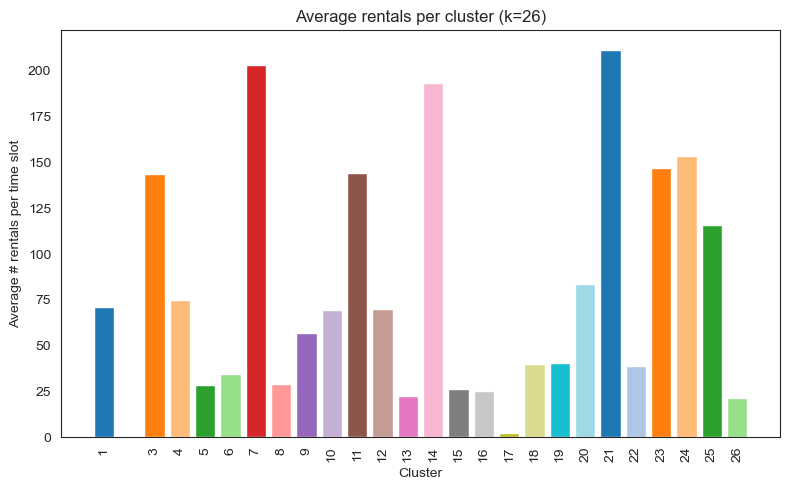

In [141]:
# --- 11. BAR CHART: AVG RENTALS PER CLUSTER (k = 26) ------------------------
# k = 26, palette as before
k = 26
palette = sns.color_palette('tab20', k)

# Make color_map 1-based: keys 1..26
color_map = {c+1: palette[c] for c in range(k)}

# avg_bikes_per_cluster as you computed it earlier
# station_cluster is already 1..26, so no +1 needed
clusters_1based = avg_bikes_per_cluster['station_cluster']

# Colors for each bar using the 1-based map
bar_colors = [color_map[c] for c in clusters_1based]

plt.figure(figsize=(8, 5))
plt.bar(
    clusters_1based,
    avg_bikes_per_cluster['avg_num_rentals'],
    color=bar_colors
)
plt.xlabel('Cluster')
plt.ylabel('Average # rentals per time slot')
plt.title('Average rentals per cluster (k=26)')
plt.xticks(clusters_1based, rotation=90)
plt.tight_layout()
plt.show()


In [143]:
# --- 14. FOCUS ON THE BUSIEST CLUSTER -------------------------------------

busiest_cluster_id = int(avg_bikes_per_cluster.iloc[0]['station_cluster'])
print("Busiest cluster:", busiest_cluster_id)

cluster_data = data[data['station_cluster'] == busiest_cluster_id].copy()

# Ensure the datetime/day/hour columns exist on cluster_data
cluster_data['pickup_datetime'] = pd.to_datetime(cluster_data['starttime'])
cluster_data['pickup_day'] = cluster_data['pickup_datetime'].dt.date
cluster_data['pickup_hour'] = cluster_data['pickup_datetime'].dt.hour

cluster_data['dropoff_datetime'] = pd.to_datetime(cluster_data['stoptime'])
cluster_data['dropoff_day'] = cluster_data['dropoff_datetime'].dt.date
cluster_data['dropoff_hour'] = cluster_data['dropoff_datetime'].dt.hour

# Hourly pickups and dropoffs within that cluster
hourly_pickups_cluster = (
    cluster_data
    .groupby(['pickup_datetime', 'pickup_day', 'pickup_hour'])['bikeid']
    .size()
    .reset_index(name='num_rentals')
)

hourly_dropoffs_cluster = (
    cluster_data
    .groupby(['dropoff_datetime', 'dropoff_day', 'dropoff_hour'])['bikeid']
    .size()
    .reset_index(name='num_rentals')
)

hourly_pickups_cluster.head()


Busiest cluster: 21


,pickup_datetime,pickup_day,pickup_hour,num_rentals


In [144]:
# --- 15. FILL MISSING HOURS WITH ZERO RENTALS ------------------------------

def fill_missing_hours(df):
    """
    Assumes df has columns:
        'pickup_datetime', 'pickup_day', 'pickup_hour', 'num_rentals'
    Returns a DataFrame with a complete hourly grid where missing hours have
    num_rentals = 0.
    """
    start = df['pickup_datetime'].min().floor('H')
    end   = df['pickup_datetime'].max().ceil('H')

    all_hours = pd.date_range(start=start, end=end, freq='H')
    all_df = pd.DataFrame({'pickup_datetime': all_hours})
    all_df['pickup_day'] = all_df['pickup_datetime'].dt.date
    all_df['pickup_hour'] = all_df['pickup_datetime'].dt.hour

    merged = pd.merge(
        all_df,
        df[['pickup_datetime', 'num_rentals']],
        on='pickup_datetime',
        how='left'
    )
    merged['num_rentals'] = merged['num_rentals'].fillna(0).astype(int)
    return merged

hourly_pickups_cluster = fill_missing_hours(hourly_pickups_cluster)

print("Shape after filling:", hourly_pickups_cluster.shape)
hourly_pickups_cluster.head()


/var/folders/vt/ws6ct2s14v5839rlq13q46900000gn/T/ipykernel_1288/449815643.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  all_hours = pd.date_range(start=start, end=end, freq='H')


ValueError: Neither `start` nor `end` can be NaT

In [145]:
# --- 16. TRAIN / TEST SPLIT FOR TIME SERIES --------------------------------

END_TRAINING_DATE = pd.to_datetime("2018-10-31")

hourly_pickups_cluster['pickup_day'] = pd.to_datetime(hourly_pickups_cluster['pickup_day'])

train_data = hourly_pickups_cluster[hourly_pickups_cluster['pickup_day'] <= END_TRAINING_DATE].copy()
test_data  = hourly_pickups_cluster[hourly_pickups_cluster['pickup_day'] >  END_TRAINING_DATE].copy()

train_data = train_data.set_index('pickup_datetime')
test_data  = test_data.set_index('pickup_datetime')

train_data.index = pd.to_datetime(train_data.index)
test_data.index  = pd.to_datetime(test_data.index)

print("Train shape:", train_data.shape, "Test shape:", test_data.shape)


Train shape: (0, 3) Test shape: (0, 3)


In [146]:
# --- 17. FIT ARIMA MODEL (BASELINE) ----------------------------------------

# Simple AR(24) model as in your original attempt
model = ARIMA(train_data['num_rentals'], order=(24, 0, 0))
model_fit = model.fit()
print(model_fit.summary())


ValueError: zero-size array to reduction operation maximum which has no identity

MAE:  0.00
RMSE: 0.00


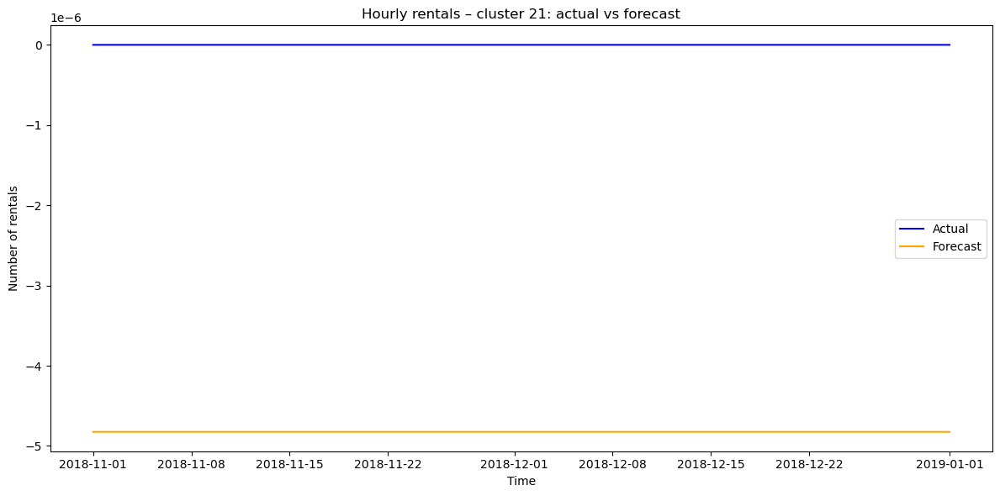

In [51]:
# --- 18. FORECAST AND EVALUATE ---------------------------------------------

n_steps = len(test_data)
predictions = model_fit.forecast(steps=n_steps)

test_data = test_data.copy()
test_data['predicted_num_rentals'] = predictions.values

mae = mean_absolute_error(test_data['num_rentals'], test_data['predicted_num_rentals'])
mse = mean_squared_error(test_data['num_rentals'], test_data['predicted_num_rentals'])
rmse = np.sqrt(mse)

print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

# Plot actual vs predicted
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data['num_rentals'], label='Actual', color='blue')
plt.plot(test_data.index, test_data['predicted_num_rentals'], label='Forecast', color='orange')
plt.title(f'Hourly rentals – cluster {busiest_cluster_id}: actual vs forecast')
plt.ylabel('Number of rentals')
plt.xlabel('Time')
plt.legend()
plt.tight_layout()
plt.show()
